<a href="https://colab.research.google.com/github/sahilshirke1907/Final_ML_Project/blob/main/Bike_sharing_demand_prediction_ML_regression_model_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - **Bike sharing demand prediction**



##### **Project Type**    - Regression
##### **Contribution**    - Individual
##### **Name** - Sahil Shirke


# **Project Summary -**

# The goal of this project is to develop a predictive model that can accurately forecast demand for bike rentals in Seoul, South Korea, based on historical usage patterns, weather conditions, and other relevant factors. The project involves data collection, data preparation, feature engineering, model selection, hyperparameter tuning, model training, model evaluation, and model deployment.

# The project aims to help the bike-sharing program in Seoul optimize its resources, improve user satisfaction, and reduce operating costs. The project will leverage machine learning techniques and statistical analysis to build a robust and accurate predictive model that can help the bike-sharing program make data-driven decisions.
# The success of the project will be evaluated based on the model's ability to accurately predict bike rental demand, as well as its ability to provide valuable insights and recommendations for improving the bike-sharing program's operations. The project has the potential to not only benefit the bike-sharing program in Seoul but also serve as a model for other cities and organizations looking to optimize their resource allocation and improve their service offerings.

# Data Description
# The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.




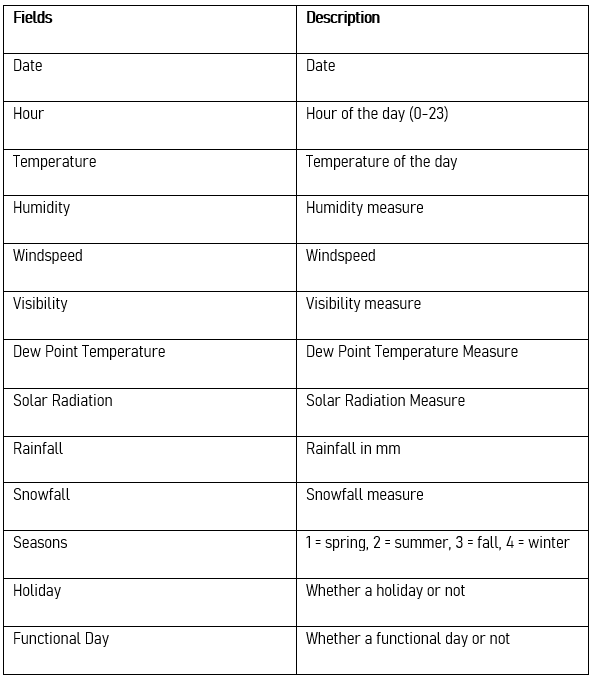

# **GitHub Link -**

GitHub Link -

# **Problem Statement**


# The bike-sharing program in Seoul, South Korea, is experiencing low utilization rates and inefficient allocation of resources. The goal of this project is to develop a predictive model that can accurately forecast demand for bike rentals based on historical usage patterns, weather conditions, and other relevant factors. By doing so, we aim to help the bike-sharing program optimize its resources, improve user satisfaction, and reduce operating costs.

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [1]:
# Importing required Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import Ridge, Lasso
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV
from statsmodels.stats.outliers_influence import variance_inflation_factor
import datetime as dt
import warnings
warnings.filterwarnings('ignore')

### Dataset Loading

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Loading Dataset using Github link.
Data_url = '/content/drive/MyDrive/Capstone Projects/Project 6/Dataset/SeoulBikeData.csv'
data = pd.read_csv(Data_url, encoding= 'unicode_escape')

### Dataset First View

In [4]:
# Dataset First Look (first five rows)
data.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


### Dataset Rows & Columns count

In [5]:
# Dataset Rows & Columns count
print(f'Dataset has {data.shape[0]} rows and {data.shape[1]} columns')

Dataset has 8760 rows and 14 columns


### Dataset Information

In [6]:
# Dataset Info
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

#### Duplicate Values

In [7]:
# Dataset Duplicate Value Count
print(f'There are {len(data[data.duplicated()])} duplicate values in dataset.')

# As we can see there are no duplicate values in the Dataset.

There are 0 duplicate values in dataset.


#### Missing Values/Null Values

In [8]:
# Missing Values/Null Values Count
data.isna().sum()

# No Missing Values/Null Values found in dataset.

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

### What did you know about your dataset?

1)Null values/missing values- 0

2)Dataset has 8760 rows and 14 columns

3)Date- columns need to convert into proper data type.

4)No duplicate Values found in dataset.

5)Columns to convert into numeric(for modelling Purpose)

  seasons

  holiday

  functioning day

## ***2. Understanding Your Variables***

In [9]:
# Dataset Columns
data.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')

In [10]:
# Dataset Description
data.describe(include='all')

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
count,8760,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760,8760,8760
unique,365,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,2,2
top,01/12/2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Spring,No Holiday,Yes
freq,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2208,8328,8465
mean,NaN,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068,NaN,NaN,NaN
std,NaN,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746,NaN,NaN,NaN
min,NaN,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000,NaN,NaN,NaN
50%,NaN,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000,NaN,NaN,NaN
75%,NaN,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000,NaN,NaN,NaN


### Variables Description

Date : year-month-day

Rented Bike count - Count of bikes rented at each hour

Hour - Hour of he day

Temperature-Temperature in Celsius

Humidity - %

Windspeed - m/s

Visibility - 10m

Dew point temperature - Celsius

Solar radiation - MJ/m2

Rainfall - mm

Snowfall - cm

Seasons - Winter, Spring, Summer, Autumn

Holiday - Holiday/No holiday

Functional Day - NoFunc(Non Functional Hours), Fun(Functional hours)




### Check Unique Values for each variable.

In [11]:
# Checking Unique Values for each variable
data.nunique()

Date                          365
Rented Bike Count            2166
Hour                           24
Temperature(°C)               546
Humidity(%)                    90
Wind speed (m/s)               65
Visibility (10m)             1789
Dew point temperature(°C)     556
Solar Radiation (MJ/m2)       345
Rainfall(mm)                   61
Snowfall (cm)                  51
Seasons                         4
Holiday                         2
Functioning Day                 2
dtype: int64

## 3. ***Data Wrangling***

### Data Wrangling Code

In [ ]:
# Writing the code to make the dataset analysis ready.

In [12]:
# We can see that the Date variable is in object datatype, we need to change it into datetime datatype
data['Date'] = data['Date'].astype(np.datetime64)


data['month'] = data['Date'].dt.month

data['day'] = data['Date'].dt.day_name()



In [13]:
# Dropping Date variable from dataset
data.drop(['Date'],axis = 1, inplace = True)

In [14]:
# Defining separate data as numerical and categorical data.

# Numerical data

numerical_data = list(set(data.describe().columns.tolist()) - {'Hour','month'})

# Categorical data

categorical_data = list(set(data.columns)-set(numerical_data))


### What all manipulations have you done and insights you found?

1) Changed Date column datatype from object to Datetime data type.

2) Created new columns Day and Month from date column and dropped Date.

3) Defining separate data as numerical and categorical data.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1
# Visualizing data distribution of our dependent variable (Rented Bike Count)

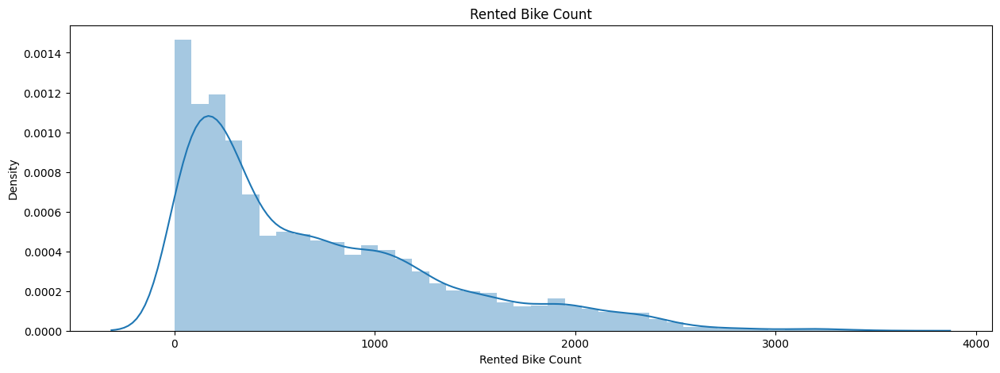

In [15]:
# Chart - 1 visualization code

plt.figure(figsize=(15,5))
plt.title('Rented Bike Count')
sns.distplot(data['Rented Bike Count'] )
plt.show()

##### 1. Why did you pick the specific chart?

Distplot is one of the best charts to show the data distribution.

##### 2. What is/are the insight(s) found from the chart?

Data is positively skewed may need to transform it further.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

As of now we know that the data is positively skewed that means the bike demand for smaller bulks is more.

#### Chart - 2
# Visualizing data distribution of categorical data with respect to Rented Bike Count.

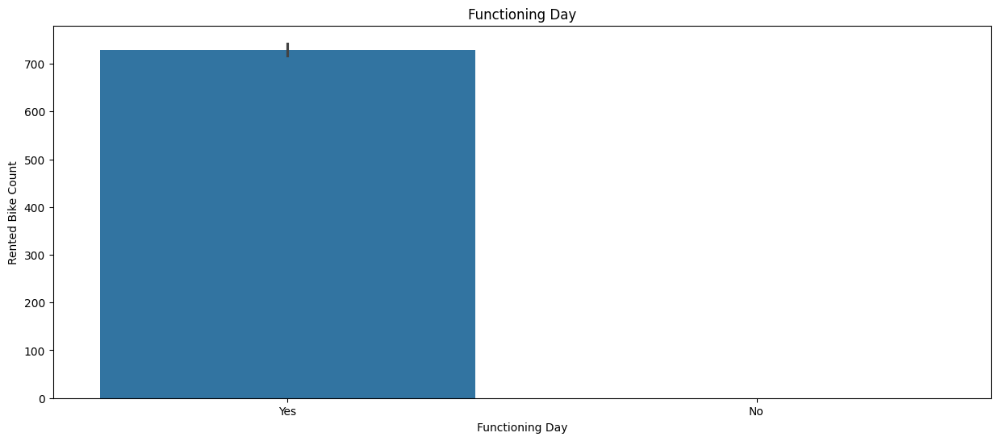

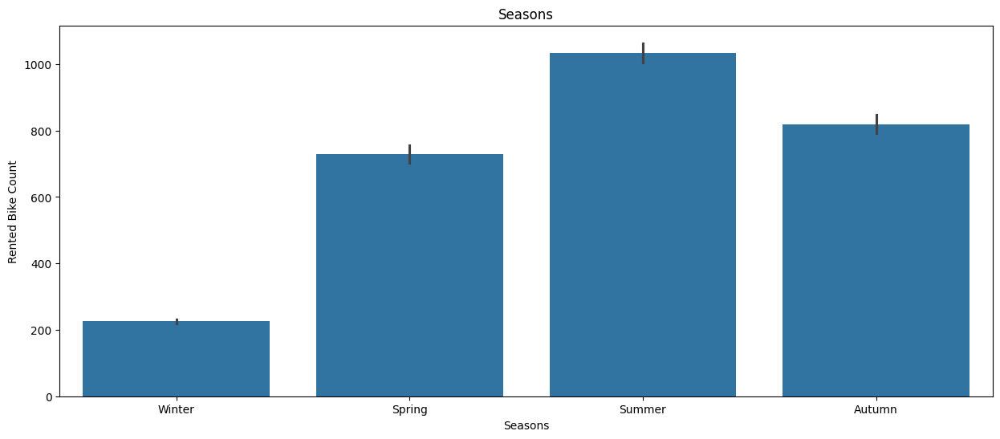

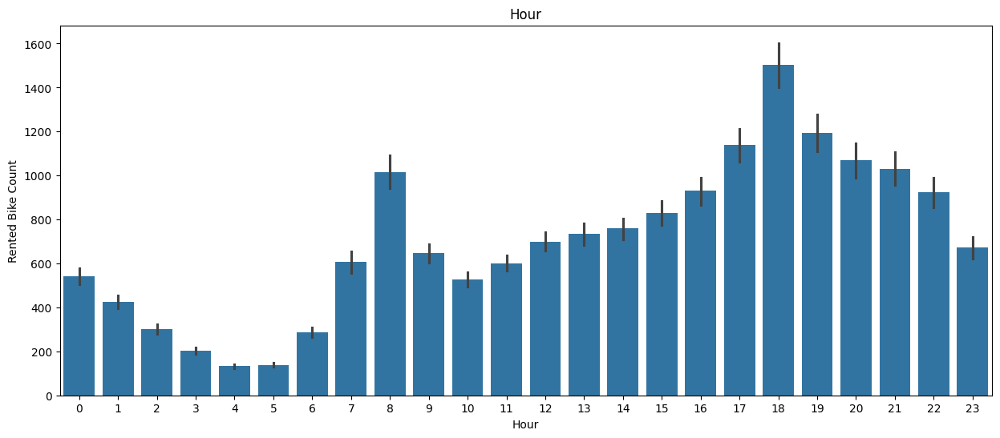

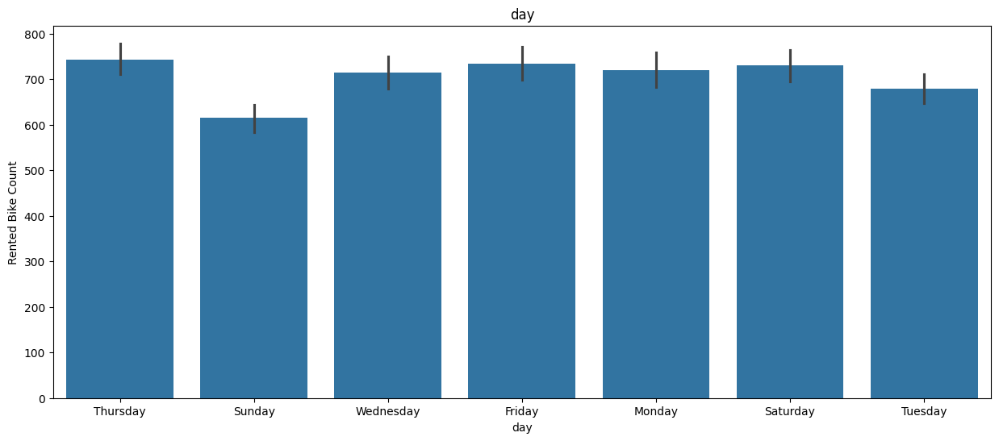

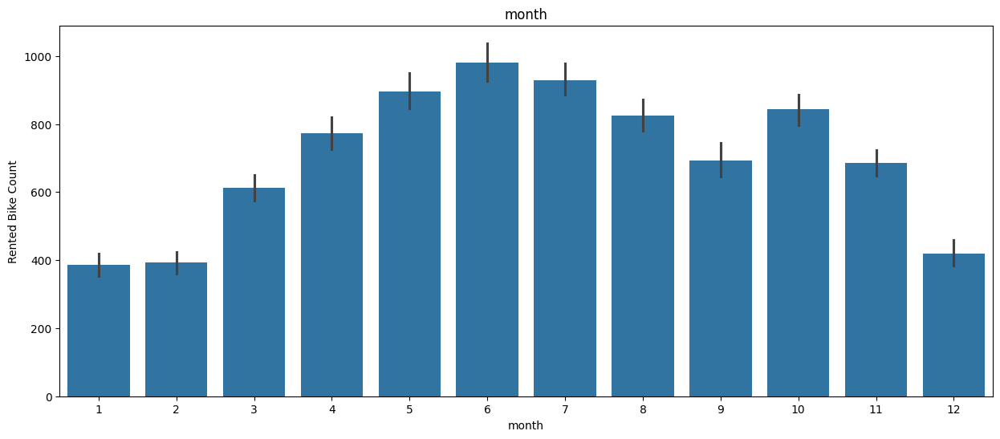

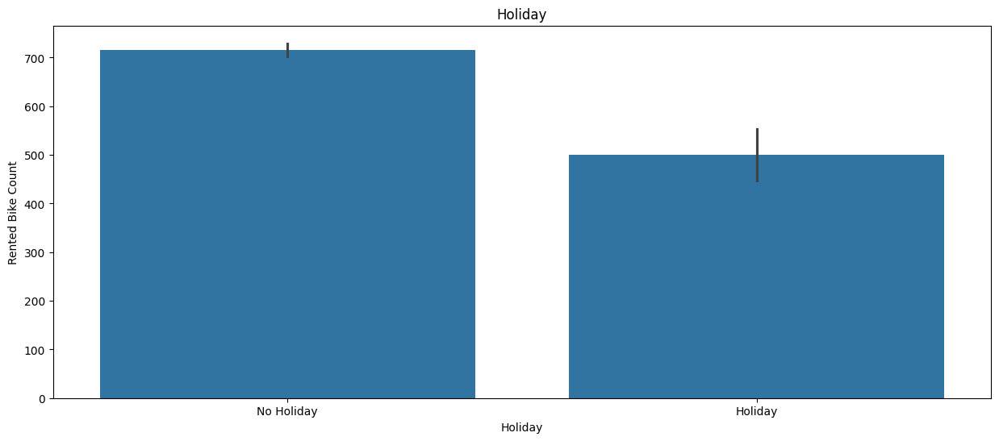

In [16]:
# Chart - 2 visualization code

# Creating a for loop for visualizing all the categorical data with respect to Rented Bike Count.

for i in categorical_data:
    plt.figure(figsize=(15,6))
    plt.title(i)
    sns.barplot(x = data[i], y = data['Rented Bike Count'])
    plt.show()

##### 1. Why did you pick the specific chart?

To visualise and spread categorical data with respect to Rented Bike Count.

##### 2. What is/are the insight(s) found from the chart?

1) The peak hours of rented bikes is 5:00PM - 7:00PM and the least bikes are rented between 3:00AM to 5:00AM.

2) June is the peak and January is the bottom months for number of rented bikes.

3) Highest no. of bikes are booked on Thursday and the least on Sunday.

4) People prefer renting bikes most in the Summer season and the least in winter season.

5) People rented more bikes on a non-holiday compared to a holiday.

6) On no functioning day no bikes were rented. we have only 295 counts of "NO". Thus we can drop that 295 values but column having only "Yes' will not add value to our column.So these columns is not use full for us. We will drop those in next steps.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The above gained insights can definitely help creating a positive business impact, we got to know how time, month, day, season and holiday impact the number of rented bikes, we can make strategies accordingly.

#### Chart - 3
#Bike Rent Count trend with respect to Hours on Months.

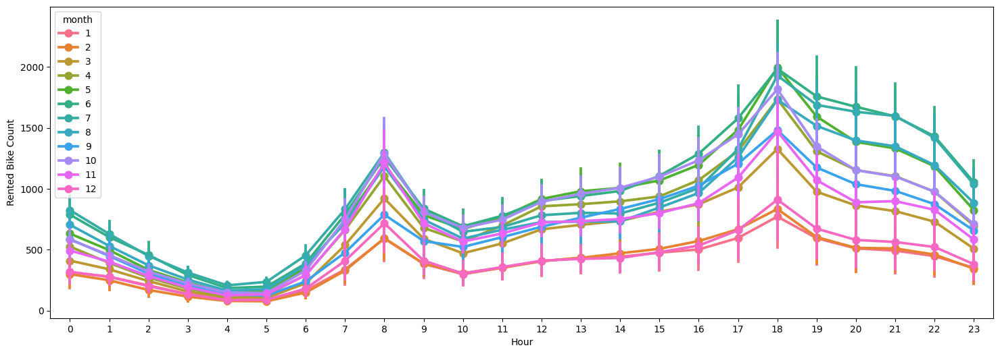

In [17]:
# Chart - 3 visualization code

colors = sns.color_palette("husl", 12)

# Create the plot
plt.figure(figsize=(18, 6))
sns.pointplot(x=data['Hour'], y=data['Rented Bike Count'], hue=data['month'], palette=colors)
plt.show()

##### 1. Why did you pick the specific chart?

To do a multivariate analysis among Hour, Rented Bike Count and Months

##### 2. What is/are the insight(s) found from the chart?

June is the peak and January is the bottom months for number of rented bikes.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The above gained insights can definitely help creating a positive business impact, we got to know how month impact the number of rented bikes, we can make strategies accordingly.

#### Chart - 4
# Bike Rent Count trend with respect Hours on Seasons.

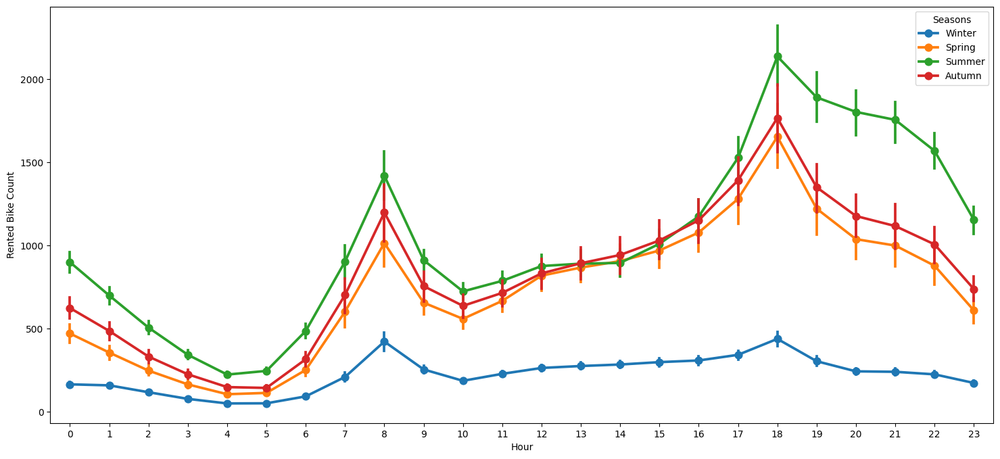

In [18]:
# Chart - 4 visualization code

# Using pointplot for multivariate analysis.

plt.figure(figsize = (18,8))
sns.pointplot(x = data['Hour'], y = data['Rented Bike Count'], hue = data['Seasons'])
plt.show()

##### 1. Why did you pick the specific chart?

To do a multivariate analysis among Hour, Rented Bike Count and Months

##### 2. What is/are the insight(s) found from the chart?

People prefer renting bikes most in the Summer season and the least in winter season.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The above gained insights can definitely help creating a positive business impact, we got to know how Seasons impact the number of rented bikes, we can make strategies accordingly.

#### Chart - 5
# Bike Rent Count trend with respect Hours on Days.

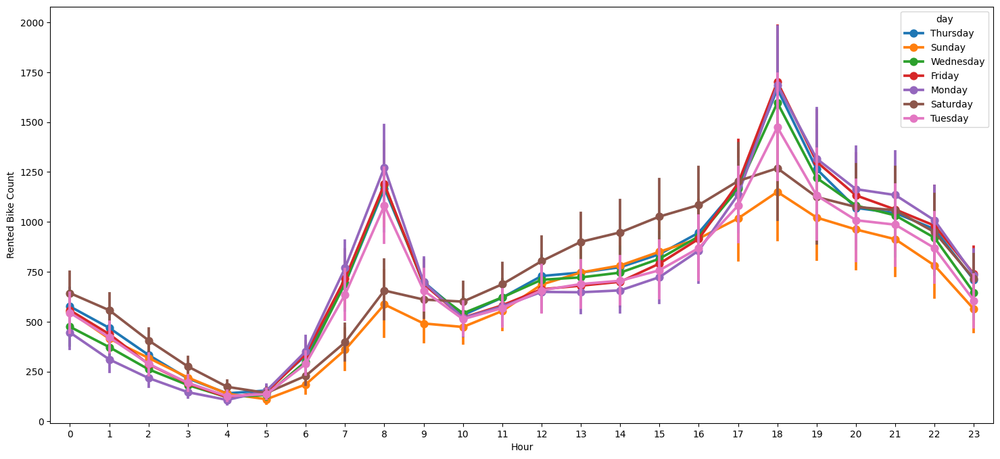

In [19]:
# Chart - 5 visualization code

# Using pointplot for multivariate analysis.

plt.figure(figsize = (18,8))
sns.pointplot(x = data['Hour'], y = data['Rented Bike Count'], hue = data['day'])
plt.show()

##### 1. Why did you pick the specific chart?

To do a multivariate analysis among Hour, Rented Bike Count and Day.

##### 2. What is/are the insight(s) found from the chart?

Highest no. of bikes are booked on Thursday and the least on Sunday.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The above gained insights can definitely help creating a positive business impact, we got to know how Days impact the number of rented bikes, we can make strategies accordingly.

#### Chart - 6
# Bike Rent Count trend with respect Hours on Holidays.

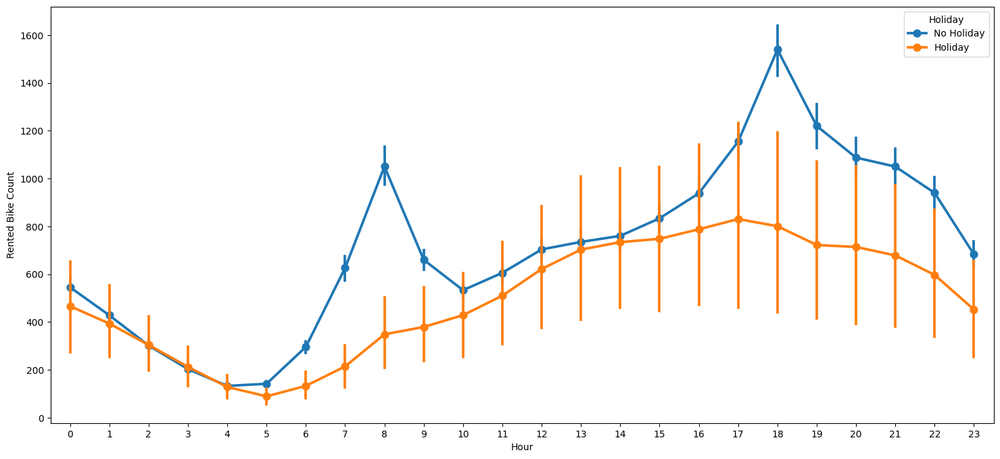

In [20]:
# Chart - 6 visualization code

# Using pointplot for multivariate analysis.

plt.figure(figsize = (18,8))
sns.pointplot(x = data['Hour'], y = data['Rented Bike Count'], hue = data['Holiday'])

plt.show()

##### 1. Why did you pick the specific chart?

To do a multivariate analysis among Hour, Rented Bike Count and Holiday.

##### 2. What is/are the insight(s) found from the chart?

People rented more bikes on a non-holiday compared to a holiday.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The above gained insights can definitely help creating a positive business impact, we got to know how Holidays impact the number of rented bikes, we can make strategies accordingly.

#### Chart - 7
# visualizing outliers using box plot of numeric columns.

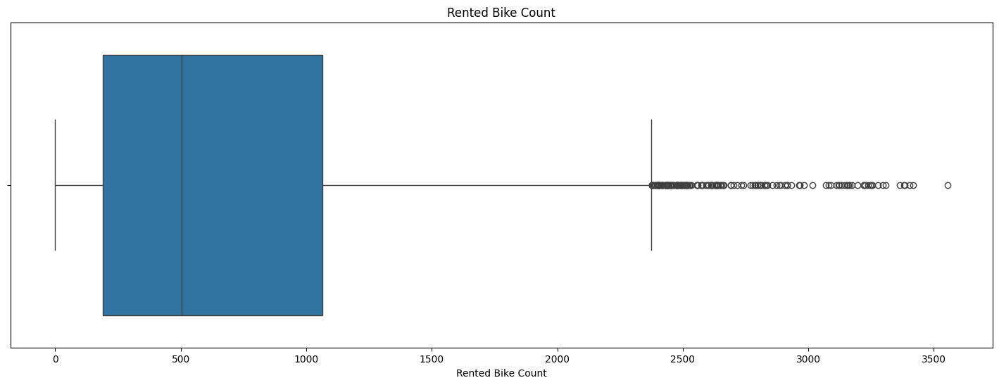

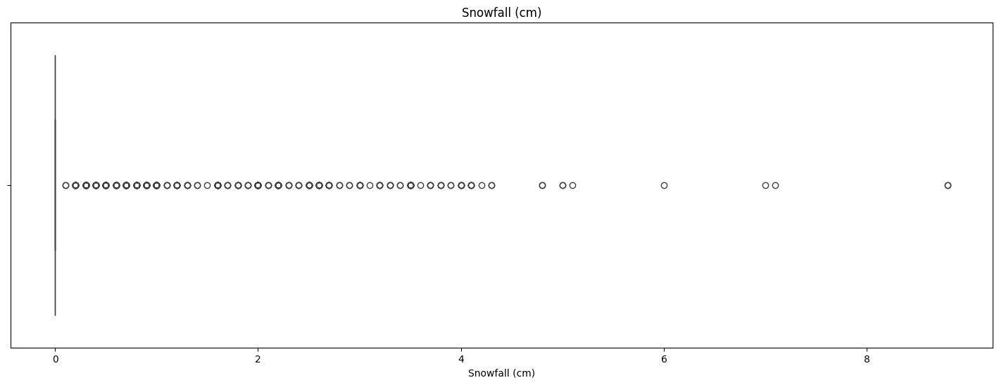

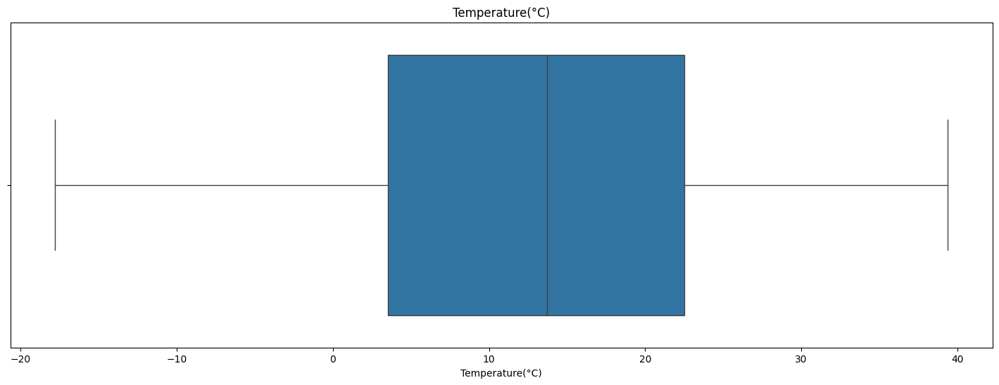

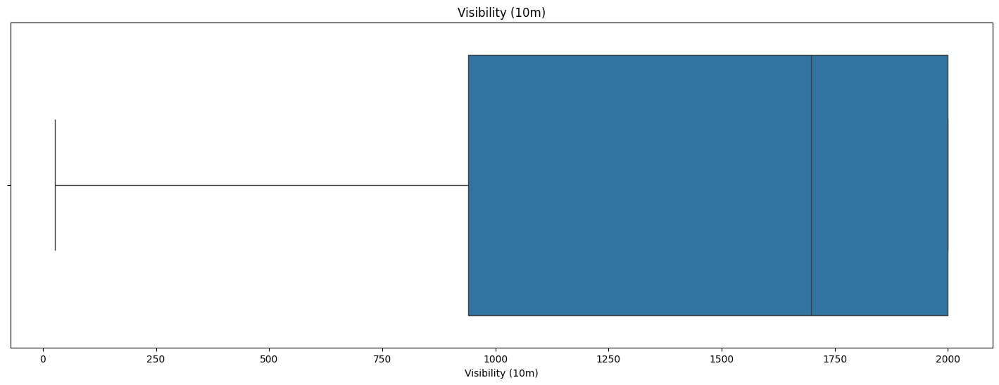

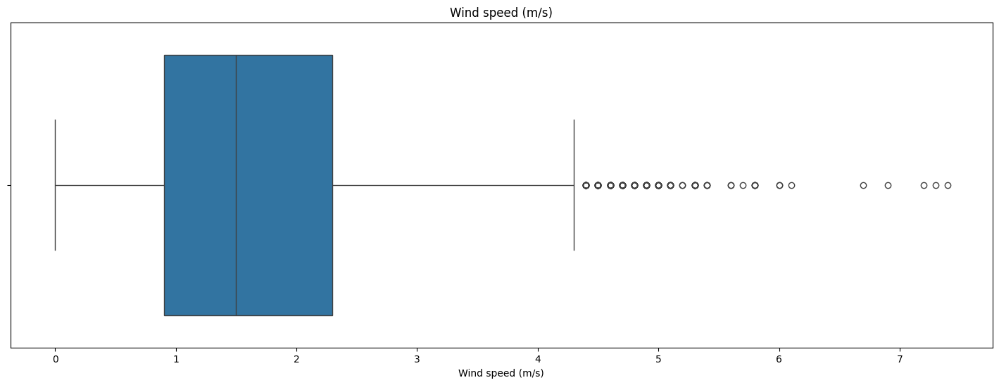

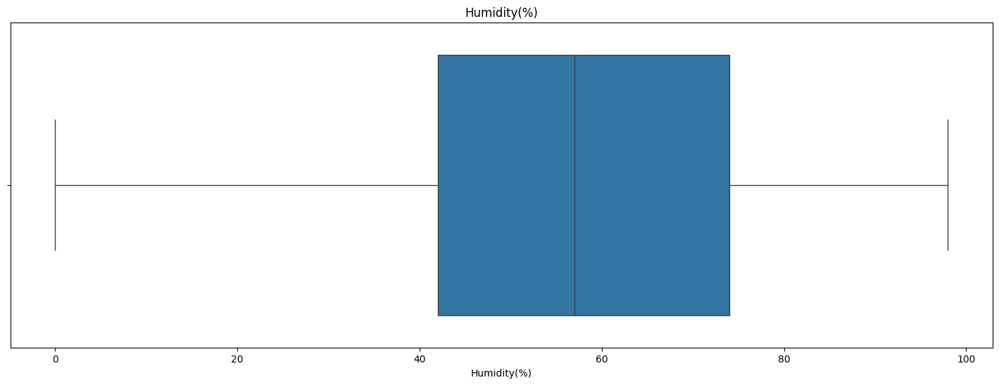

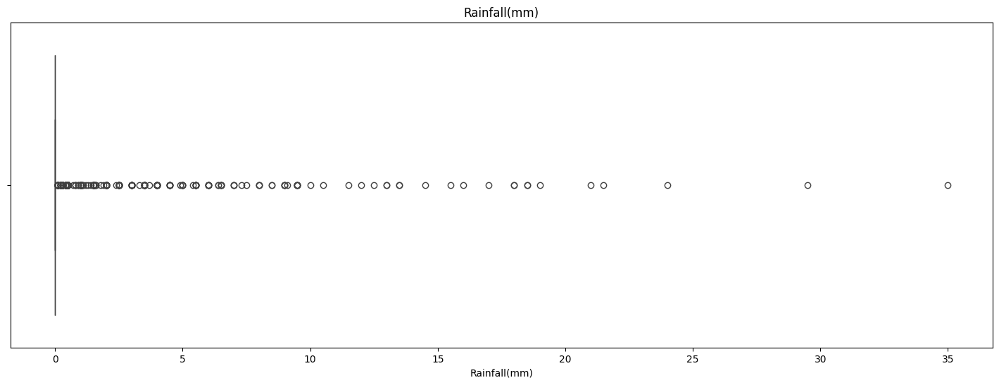

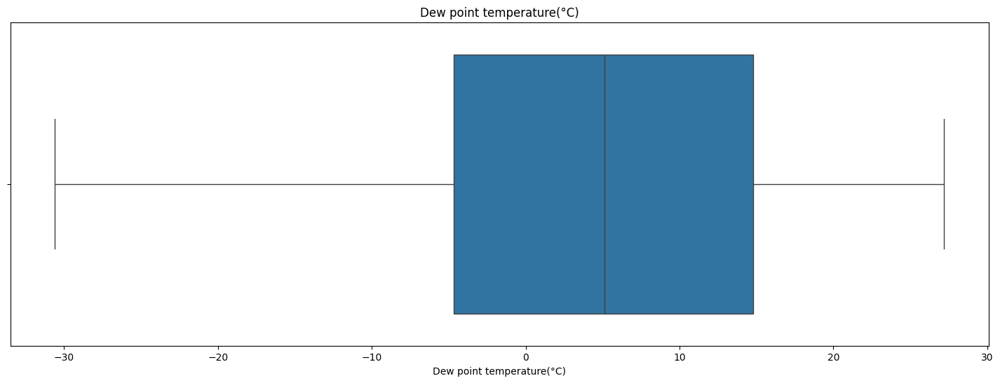

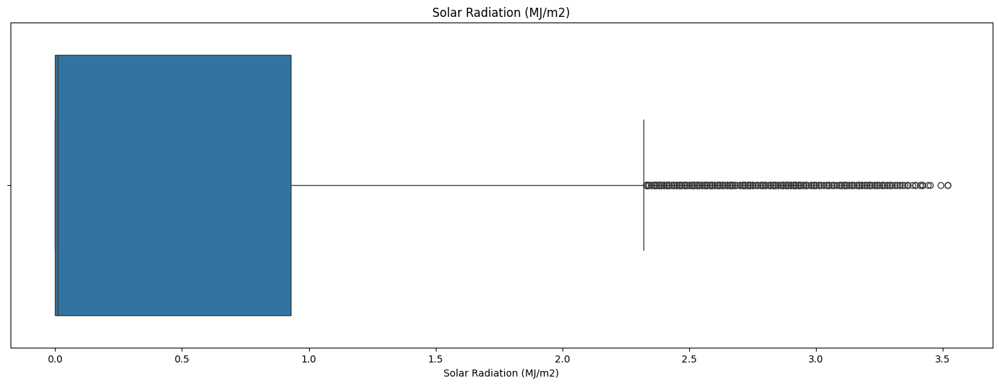

In [21]:
# Chart - 7 visualization code

# Writing code for creating a for loop for numerical variables and creting box plots.

for i in numerical_data:
  plt.figure(figsize = (18,6))
  sns.boxplot(x = data[i])
  plt.title(i)
  plt.show()

##### 1. Why did you pick the specific chart?

Using Boxplots as we need to identify outliers.

##### 2. What is/are the insight(s) found from the chart?

Rainfall, Solar Radiation, Snowfall and Windspeed has high numbers of outliers.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

In some cases, outliers may represent opportunities for business growth. For example, if there are a small number of customers who are making a significantly higher number of bike rentals than the average customer, this may represent a market segment that can be targeted for special promotions or marketing campaigns.

#### Chart - 8
# Lets check the linear relationship between the dependent variable-"Rented Bike Count' and remaining columns(independent variables).

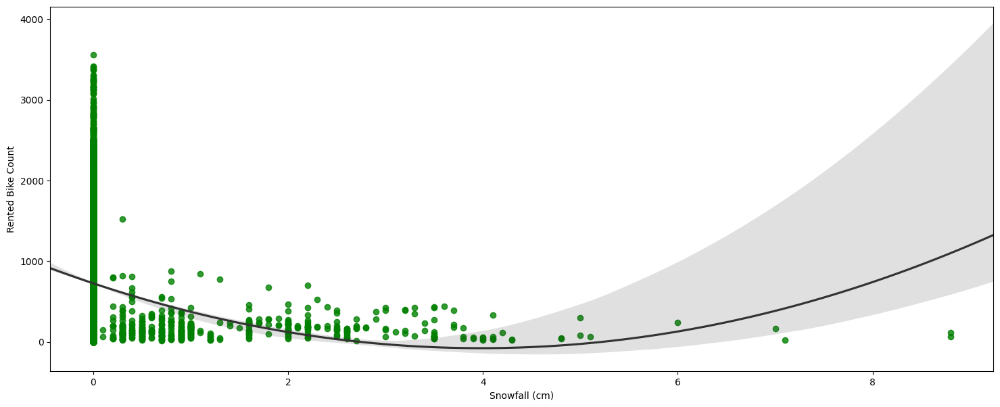

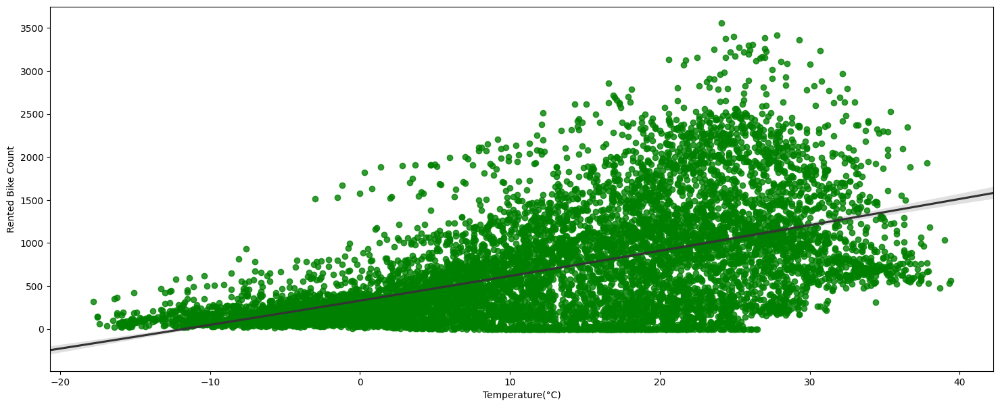

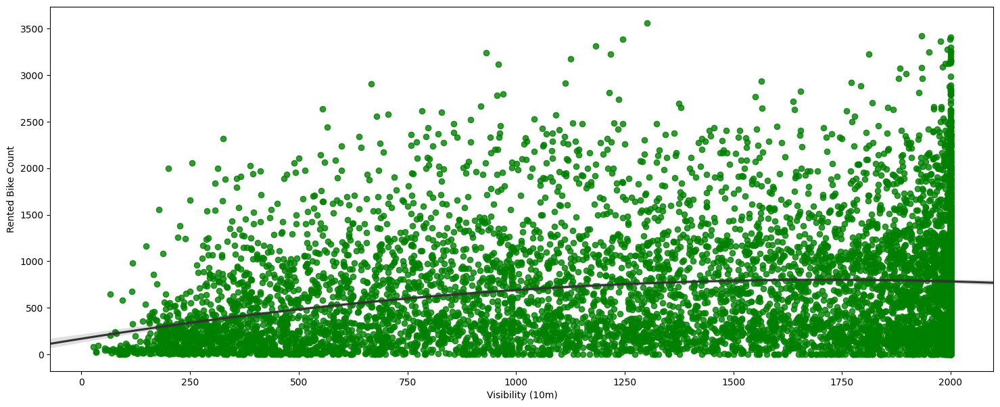

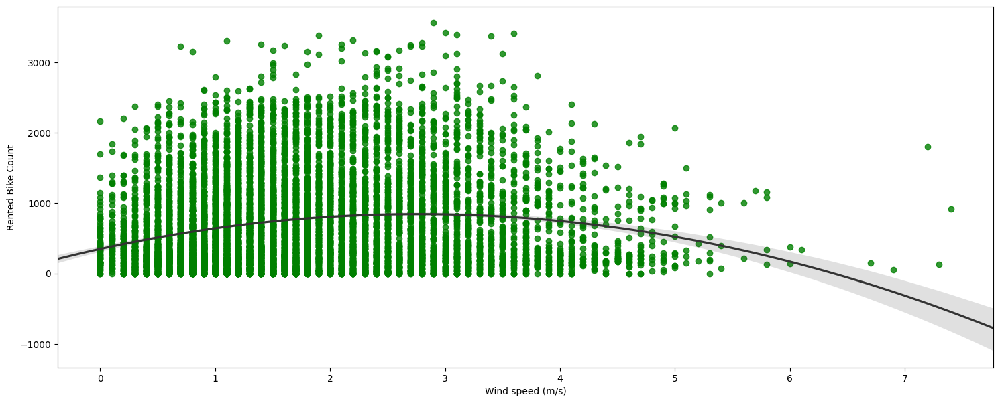

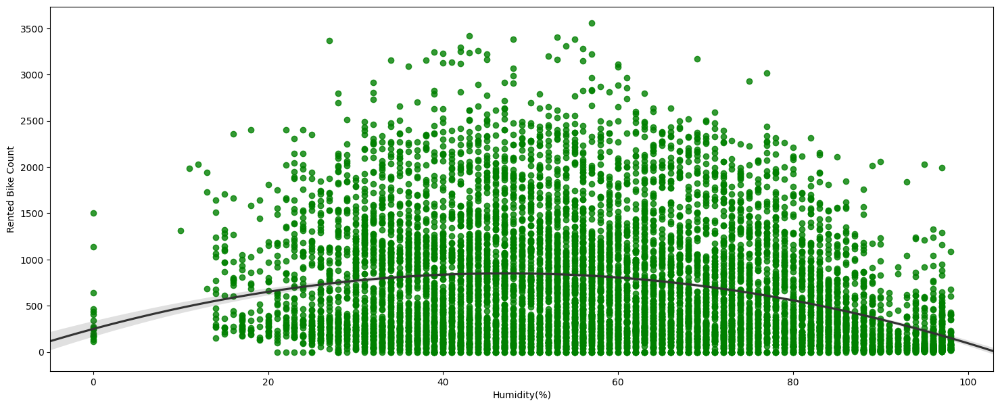

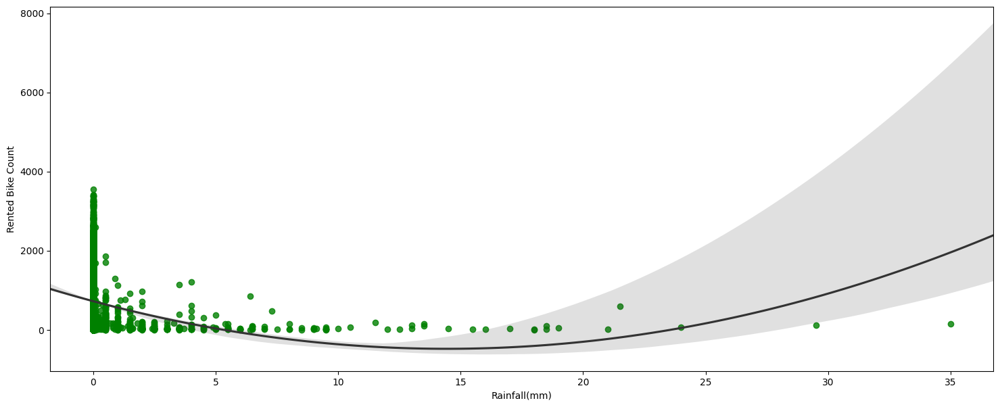

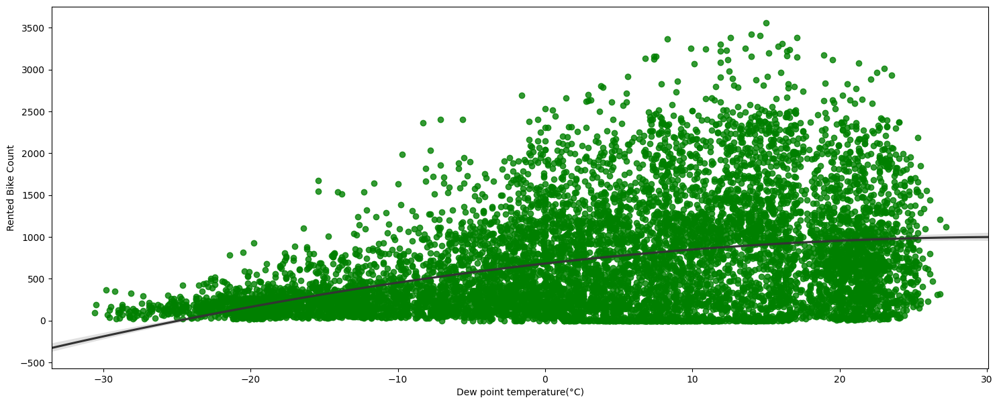

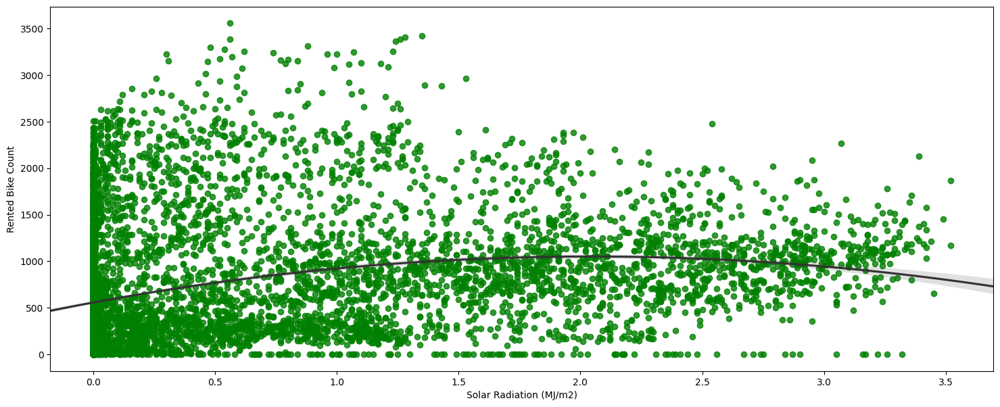

In [22]:
# Chart - 8 visualization code using regplot.
for i in numerical_data:
  if i not in ['Rented Bike Count']:
    fig = plt.figure(figsize = (18,7))
    fig = plt.gca()

    sns.regplot(
        data=data, x=i, y="Rented Bike Count",
        truncate=False, order=2, color=".2",scatter_kws={'color':'green'}
    )
    plt.show()

##### 1. Why did you pick the specific chart?

I used regplot as it allows us to quickly visualize the relationship between two variables and determine whether there is a linear or non-linear relationship between them.

##### 2. What is/are the insight(s) found from the chart?

## Hour:

1)There is sudden peak between 6/7AM to 10 AM. Office time,College and going time could be the reason for this sudden peak.

2) Again there is peak between 10 AM to 7 PM. may be its office leaving time for the above people.

3) We can say that,from morning 7 AM to Evening 7 PM we have good Bike Rent Count. and from 7 PM to 7 AM Bike Rent count starts declining.

## Temperature:

1) For decrease in temperature below 0 deg celicus the bike rent count is significantly decreased because may be people dont want to ride bike in such
cold temperature.

2) But for normal temperature the Bike rent count is very high.

##humidity

1) Here its seems like humidty is inversely proportional to bike rent count. As humdity percentage is increasing there is decrease in bike rent count.

##Wind Speed:

1) upto wind speed 4 m/s there is good bike rent count.

##Visibility:

1) It's very obivious that as visibilty increases the bike rent count also increases. Nobody would prefere to ride in low visibilty.

##Dew Point Temperature:

1)It's again the same case as of temperature. As dew temperature goes below 0 deg celcius there is less bike rent count. It looks like Dew Point temperature and Temperature columns have strong colinarity.

##Solar radiation:
:
1)Here the amount of rented bikes is huge, when there is solar radiation.

##Rainfall And snowfall:

1) Its very obivious that people usually do not like ride bikes in rain and snowfall.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The above gained insights can definitely help creating a positive business impact, we got to know how the variables impact the number of rented bikes, we can make strategies accordingly.

#### Chart - 9

# Visualizing the data distribution on the dependent variable before normalization.



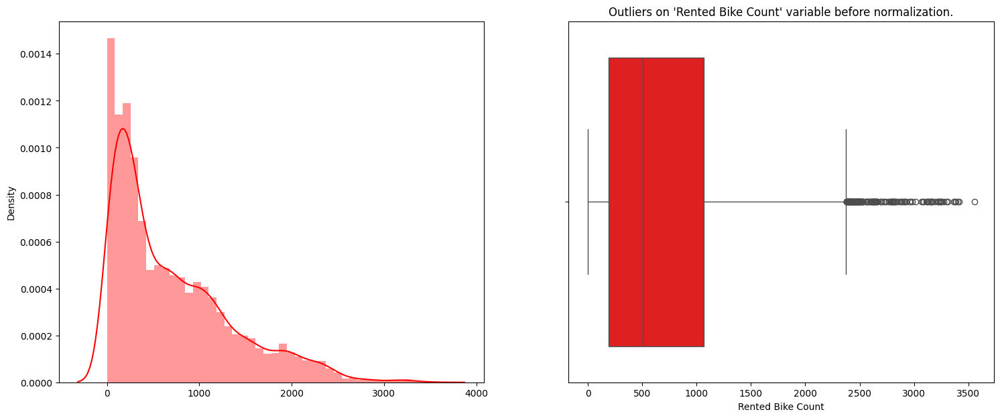

In [23]:
# Chart - 9 visualization code

# Visualizing the data distribution on the dependent variable using distplot and boxplot charts.

f, axes = plt.subplots(1, 2,figsize=(18,7))
sns.distplot(x=(data['Rented Bike Count']),color='r',ax=axes[0])
sns.boxplot(x=(data['Rented Bike Count']),color='r',ax=axes[1])
plt.title("Outliers on 'Rented Bike Count' variable before normalization.")
plt.show()

#### Chart - 10

# Visualizing the data distribution on the dependent variable after normalization.

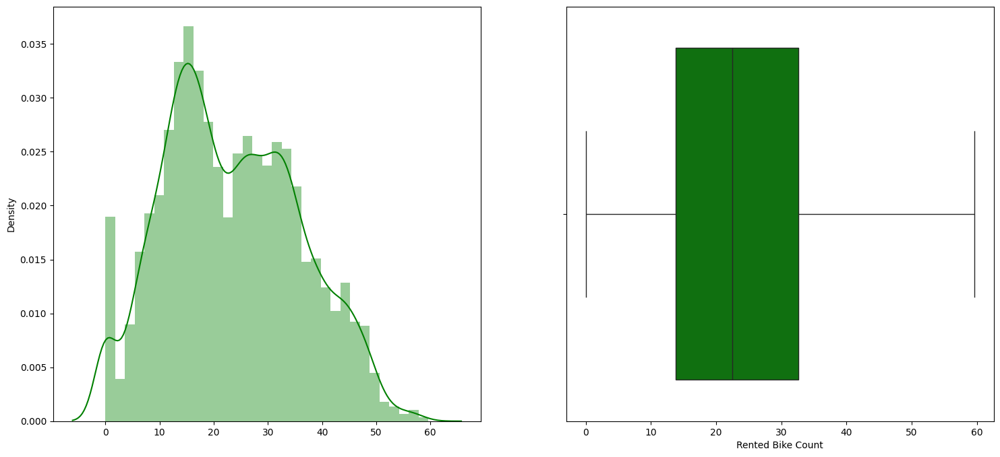

In [24]:
# Chart - 10 visualization code

# Normalizing  our target variable by squre root method

f, axes = plt.subplots(1, 2,figsize=(18,8))
sns.distplot(x=np.sqrt(data['Rented Bike Count']),color='g',ax=axes[0])
sns.boxplot(x=np.sqrt(data['Rented Bike Count']),color='g',ax=axes[1])
plt.show()

##### 1. Why did you pick the specific chart?

Used distplot to visualize the distribution of data and using boxplot to detect outliers.

##### 2. What is/are the insight(s) found from the chart?

As we can see from both the charts the distribution of the data is less skewed and is moving towards normally distributed data

The outliers are also gone after normalization.





##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Improved accuracy, comparability and better visualization are the result of normalization which can improve model performance.

#### Chart - 11

# Visualizing data distribution of numerical data.

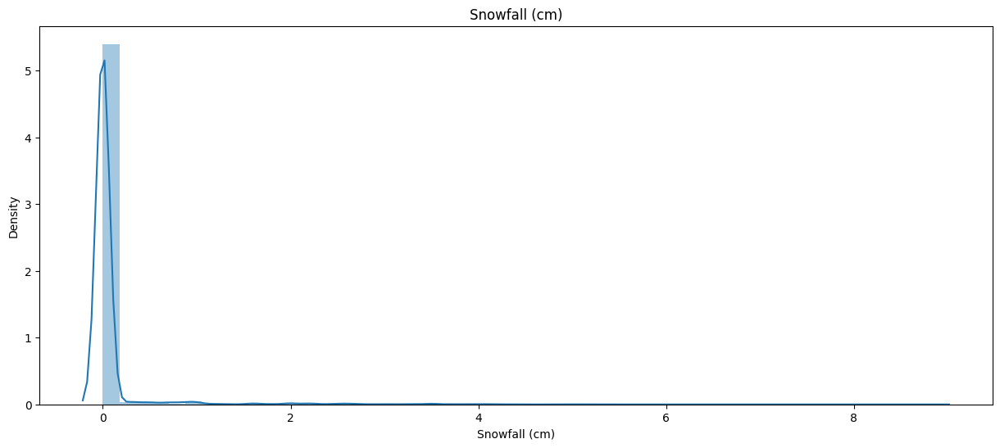

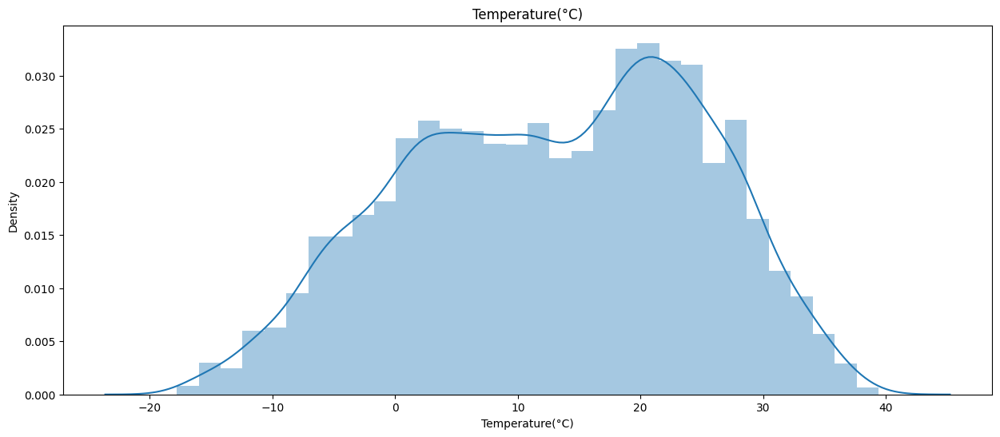

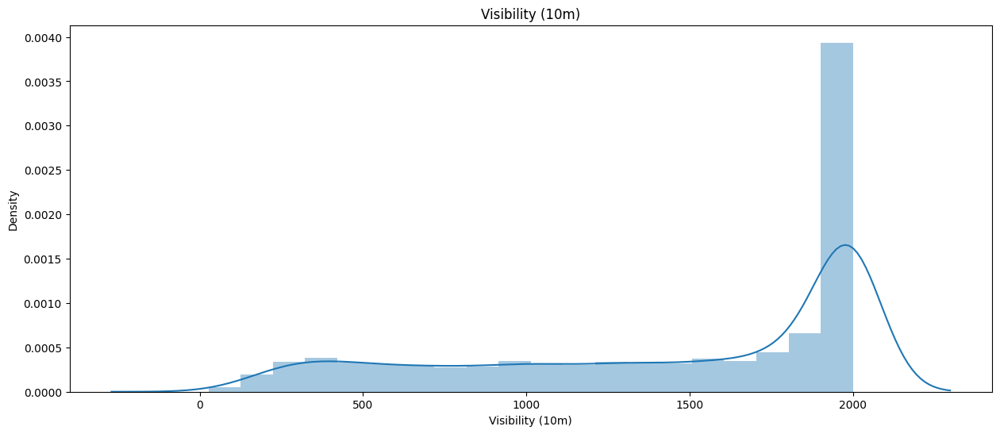

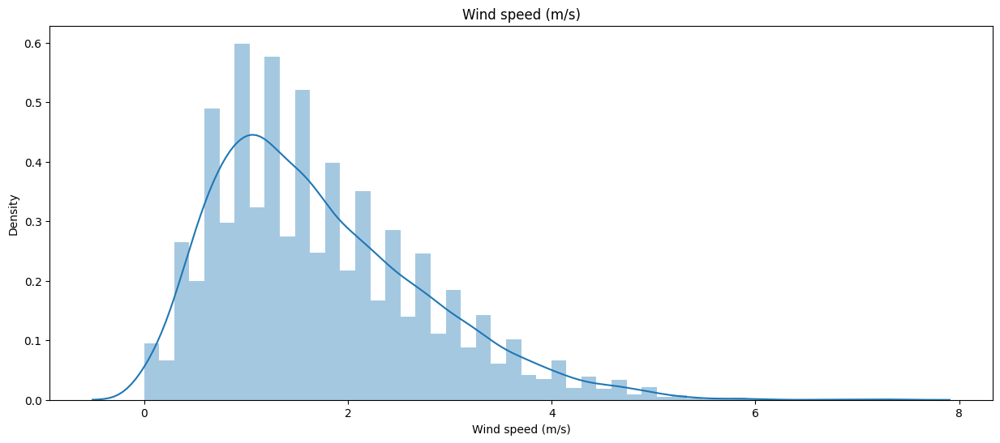

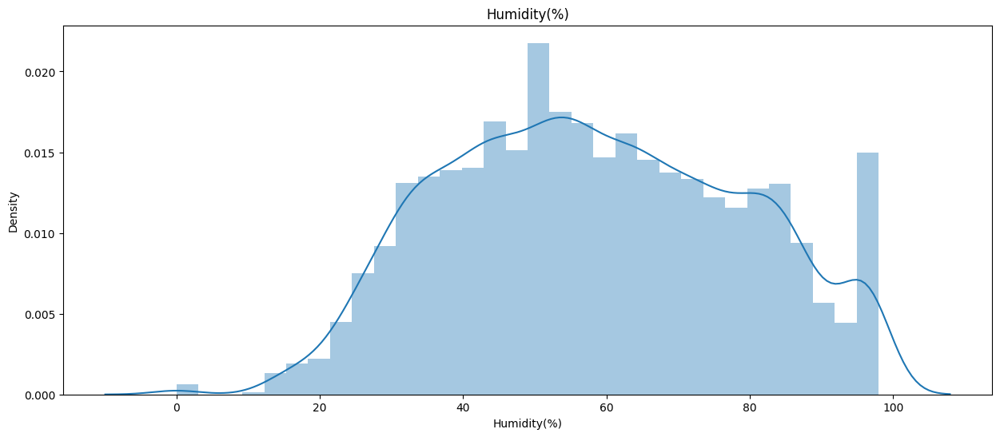

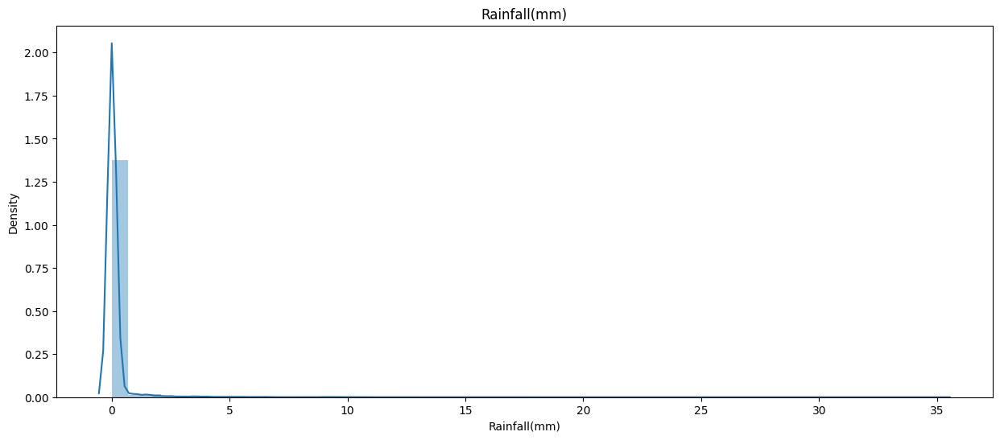

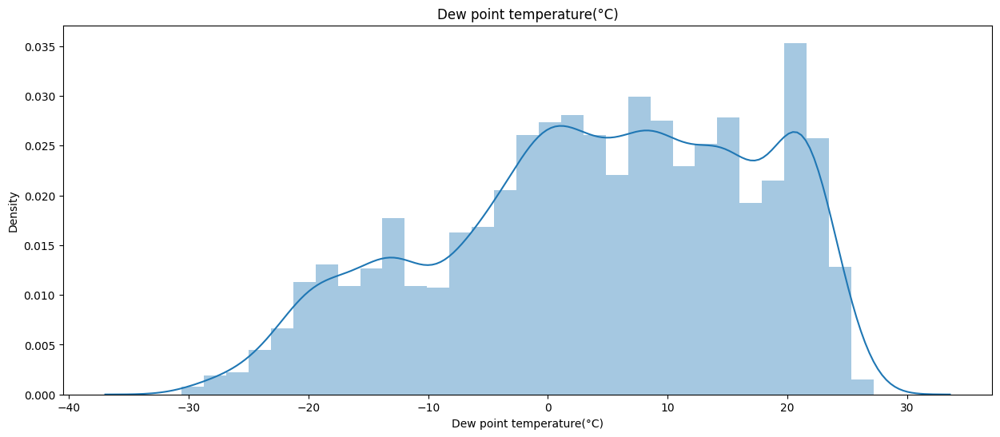

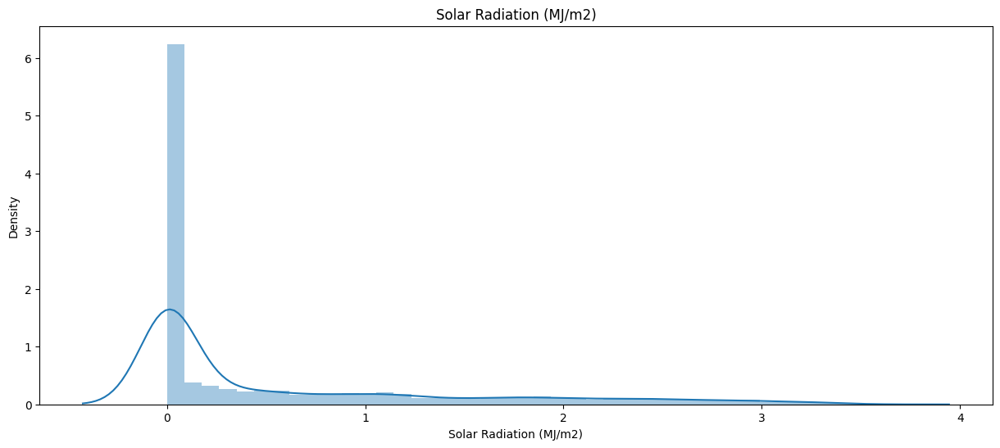

In [25]:
#Chart - 11

# Creating a for loop for visualizing all the numerical variables using distplot.

for i in numerical_data:
  if i not in ['Rented Bike Count']:
    plt.figure(figsize=(15,6))
    plt.title(i)
    sns.distplot(data[i] )
    plt.show()

##### 1. Why did you pick the specific chart?

Distplot is one of the best charts to show the data distribution.

##### 2. What is/are the insight(s) found from the chart?


Solar radiation, Snowfall, Rainfall and visibility are highly skewed.





##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

We can see that weather influences the output in a big way as the data for Solar radiation, Snowfall, Rainfall and visibility are highly skewed we can say that people choose riding a bike on specific weather conditions.


#### Chart - 12

# Visualizing the numerical after square root normalization.

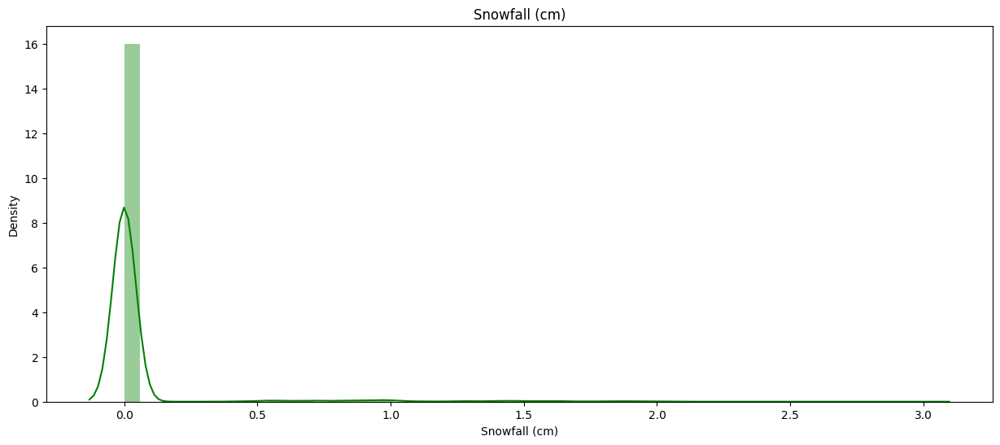

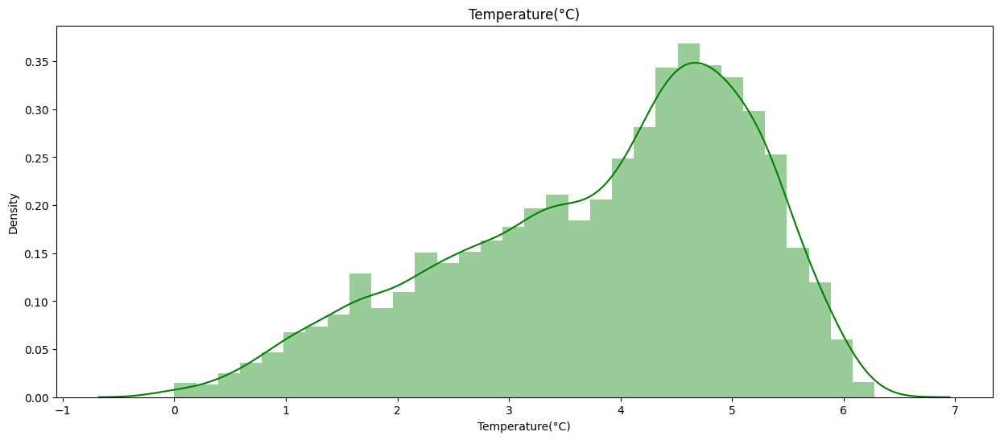

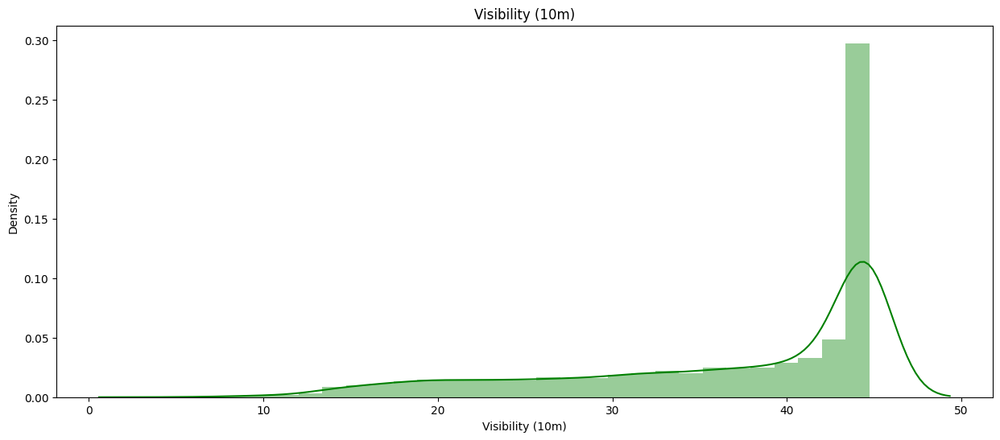

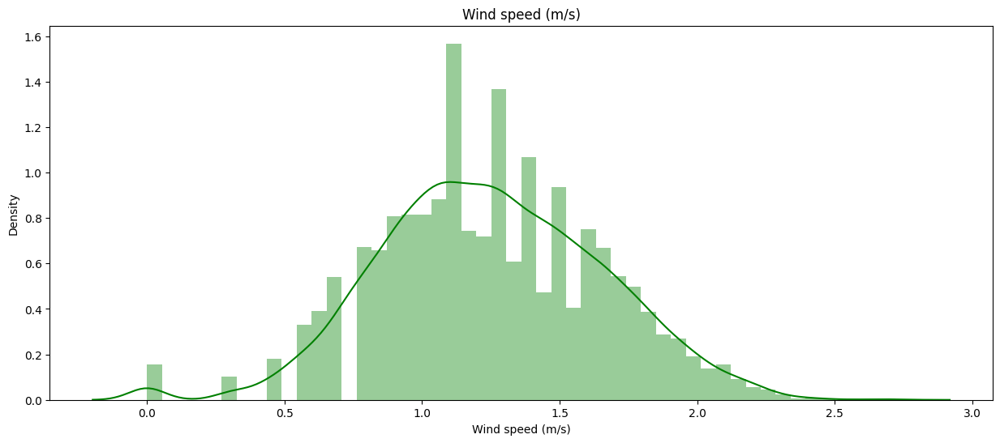

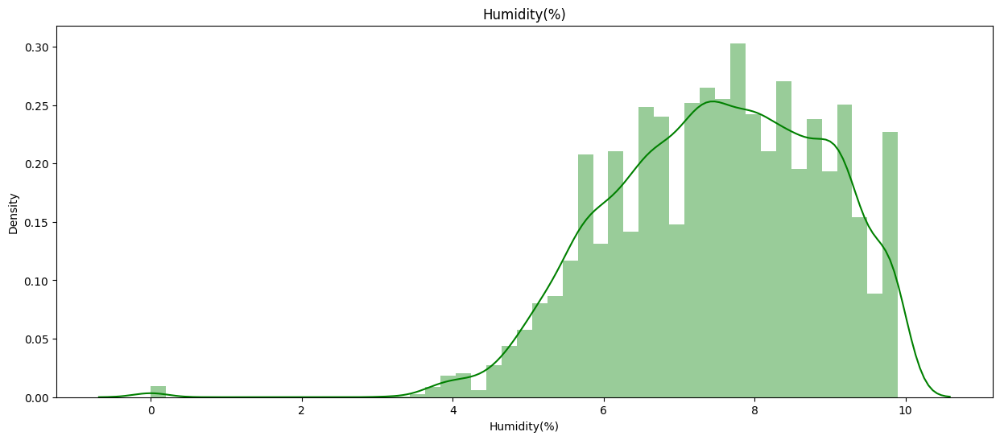

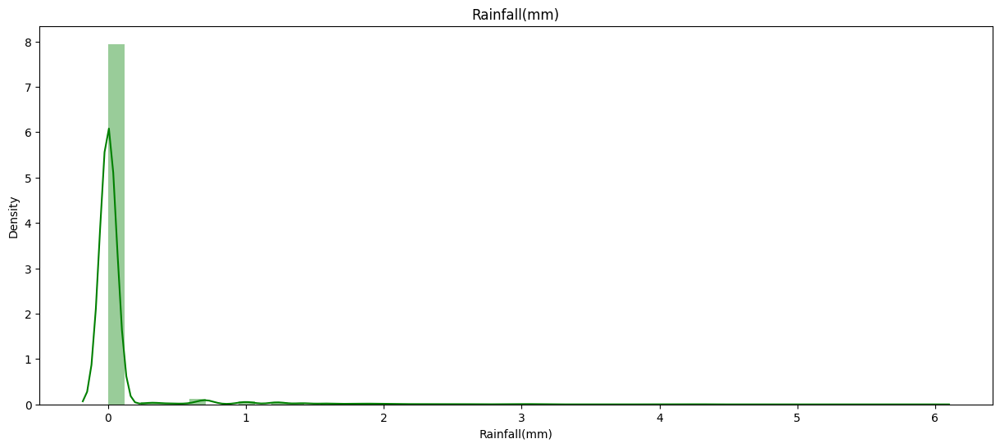

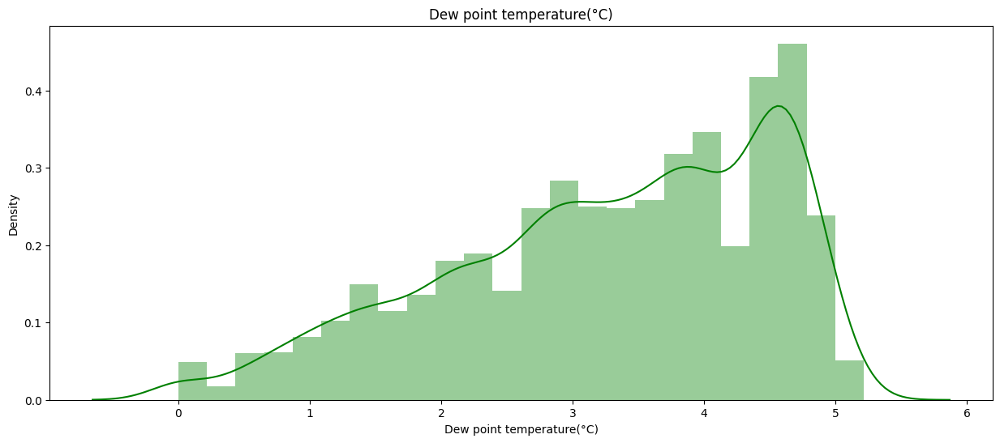

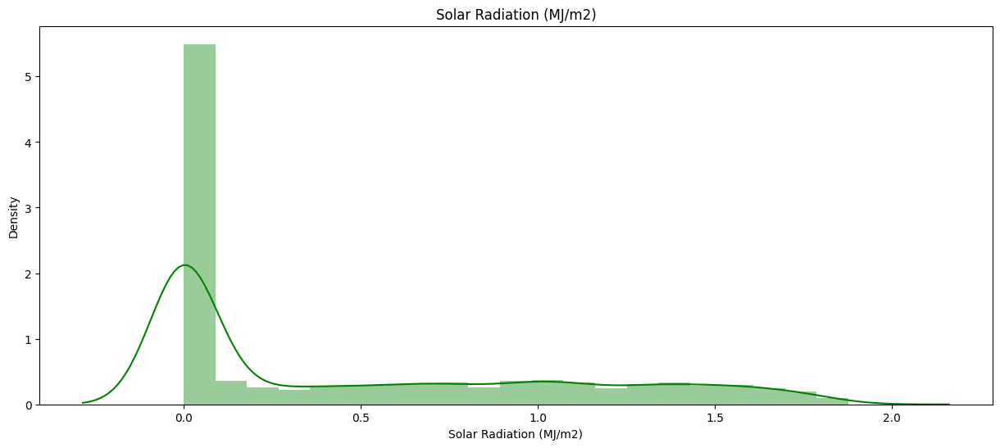

In [26]:
# Chart - 12 visualization code with distplot after normalising.
for i in numerical_data:
  if i not in ['Rented Bike Count']:
    plt.figure(figsize=(15,6))
    plt.title(i)
    sns.distplot(np.sqrt(data[i]), color = 'g' )
    plt.show()

##### 1. Why did you pick the specific chart?

Distplot is one of the best charts to show the data distribution.

##### 2. What is/are the insight(s) found from the chart?

Distribution of Wind speed, Dew point temperature, Temperature and Humidity has improved.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Improved accuracy, comparability and better visualization are the result of normalization which can improve model performance.


#### Chart - 13
# Checking distribution of numerical data with mean and median after normalization.

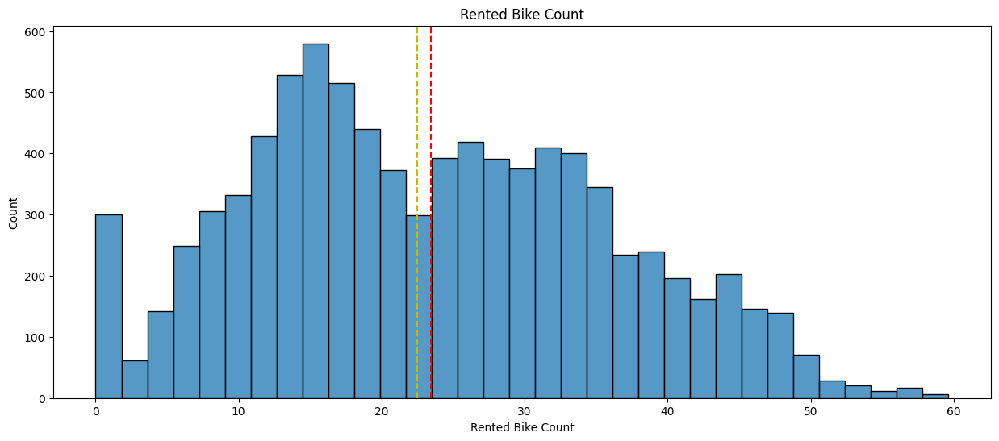

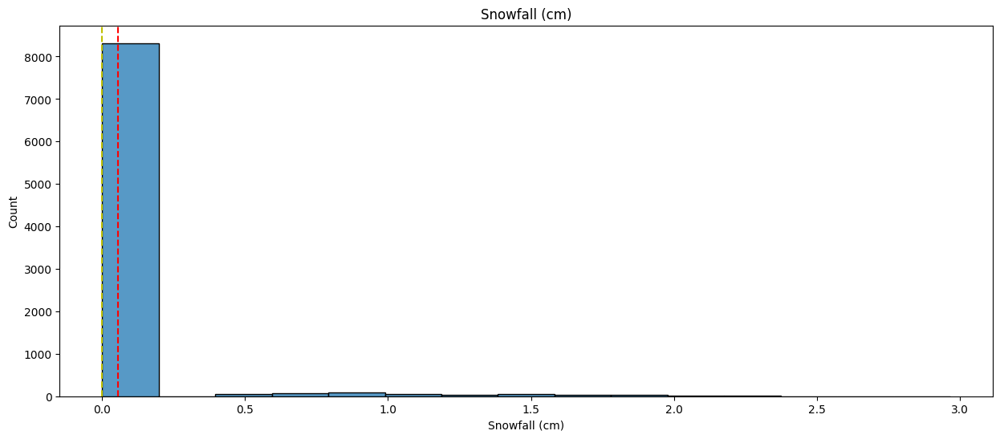

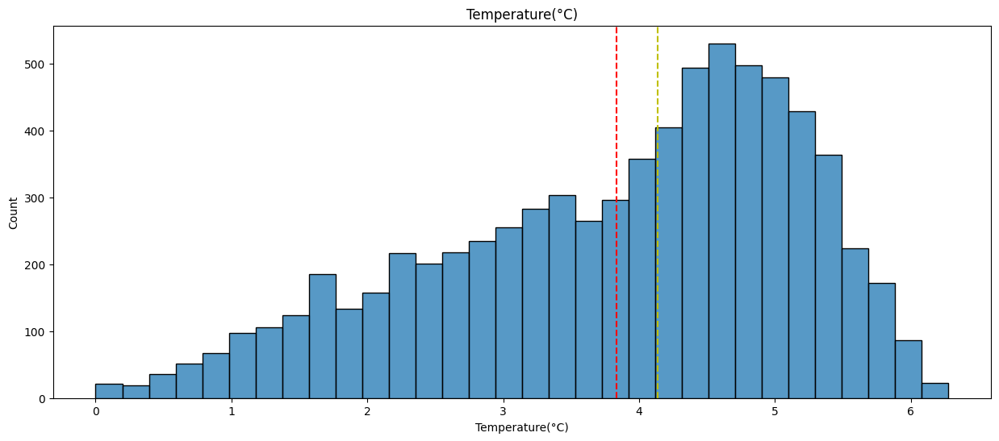

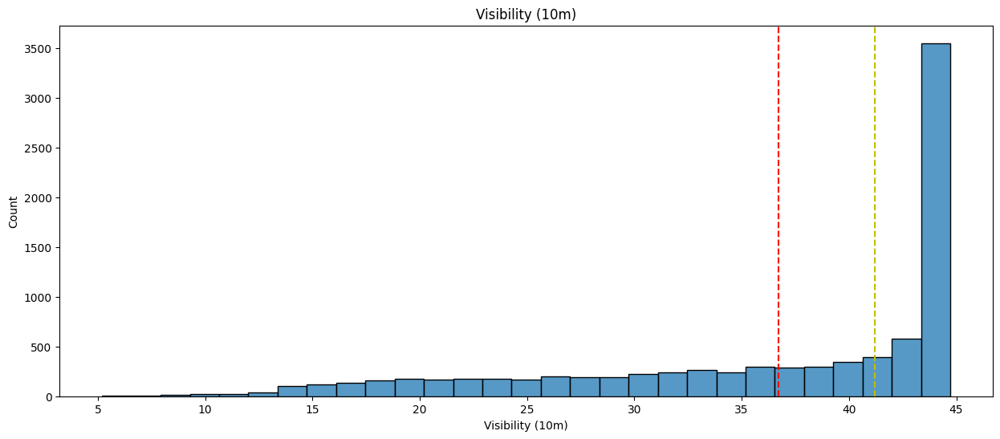

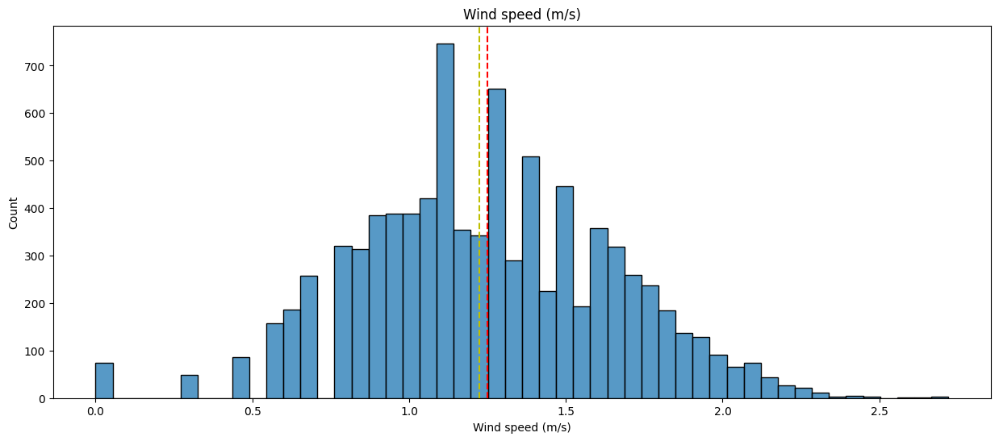

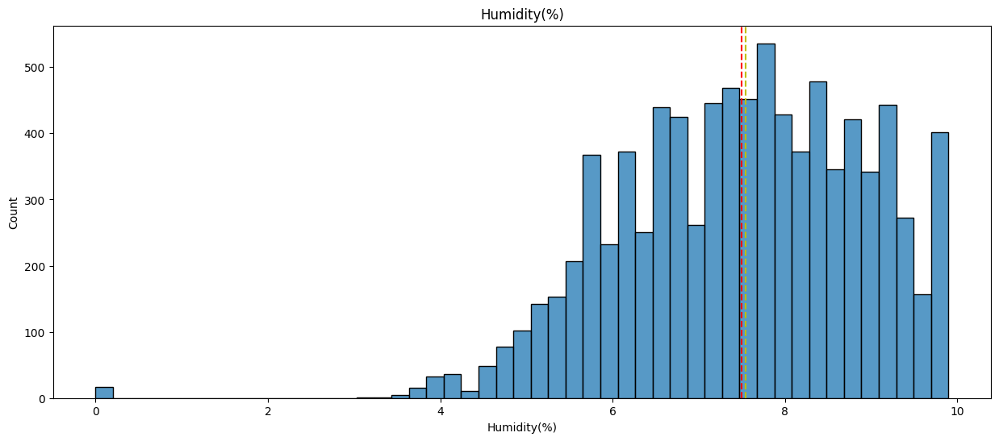

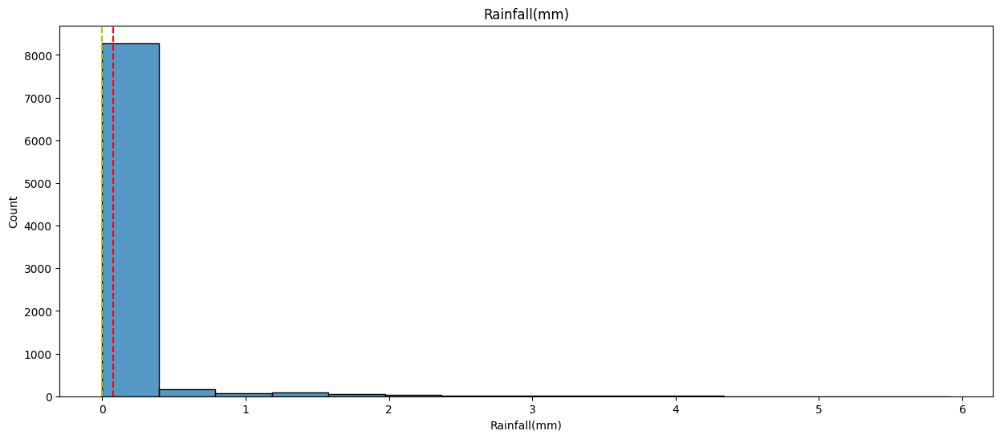

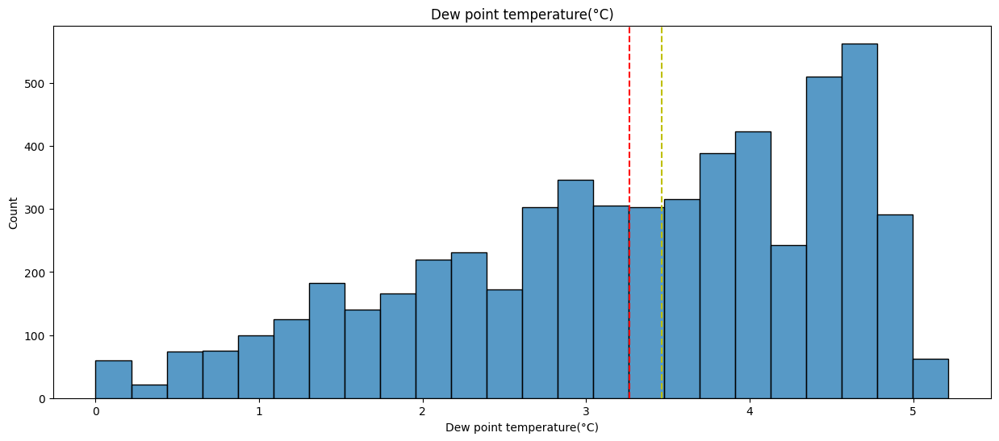

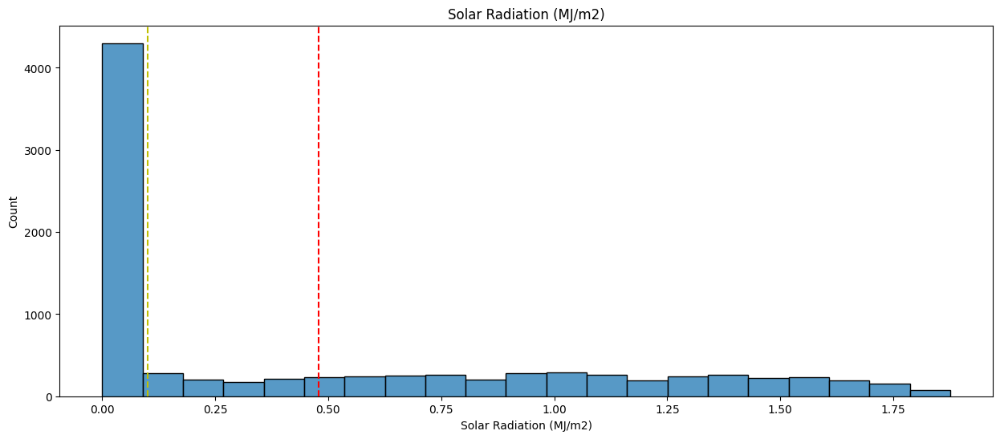

In [27]:
#Chart - 13

# Visualizing the distribution of numerical data with mean and median using histplot.

for i in numerical_data:
  fig = plt.figure(figsize = (15,6))
  sns.histplot(np.sqrt(data[i]))
  plt.axvline(np.sqrt(data[i]).mean(), linestyle = '--', color = 'r')
  plt.axvline(np.sqrt(data[i]).median(), linestyle = '--', color = 'y')
  plt.title(i)
  plt.show()

##### 1. Why did you pick the specific chart?

Histplot is one of the best charts to show the data distribution.

##### 2. What is/are the insight(s) found from the chart?

Solar radiation, Snowfall, Rainfall and visibility are still skewed but Distribution of Wind speed, Dew point temperature, Temperature and Humidity has improved.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Improved accuracy, comparability and better visualization are the result of normalization which can improve model performance.

#### Chart - 14
# Checking Corelation between dependent and independent variable using Correlation Heatmap visualization.

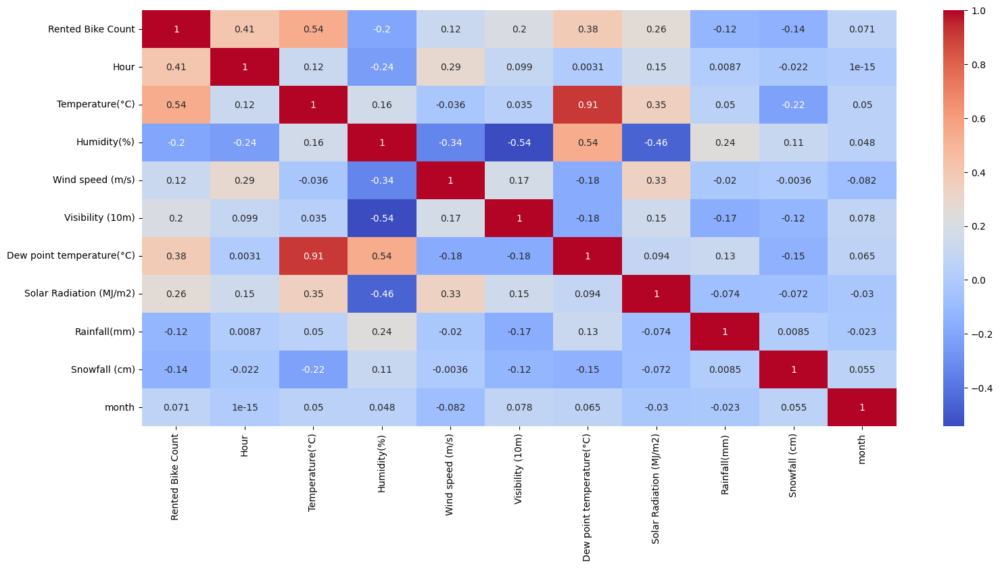

In [28]:
# Correlation Heatmap visualization code

corr = data.corr()

plt.figure(figsize = (18,8))
sns.heatmap(corr, annot = True , cmap = 'coolwarm')
plt.show()

##### 1. Why did you pick the specific chart?

I used correlation heatmap to visualize the correlation among variables.

##### 2. What is/are the insight(s) found from the chart?

Temperature and Dew point Temperature are highly correlated.
As per our regression assumption, there should not be colinearity between independent variables.
We can see from the heatmap that "Temperature" and "Dew Point Temperature" are highly corelated. We can drop one of them.As the corelation between temperature and our dependent variable "Bike Rented Count" is high. So we will Keep the Temperature column and drop the "Dew Point Temperature" column.

#### Chart - 15 - Pair Plot

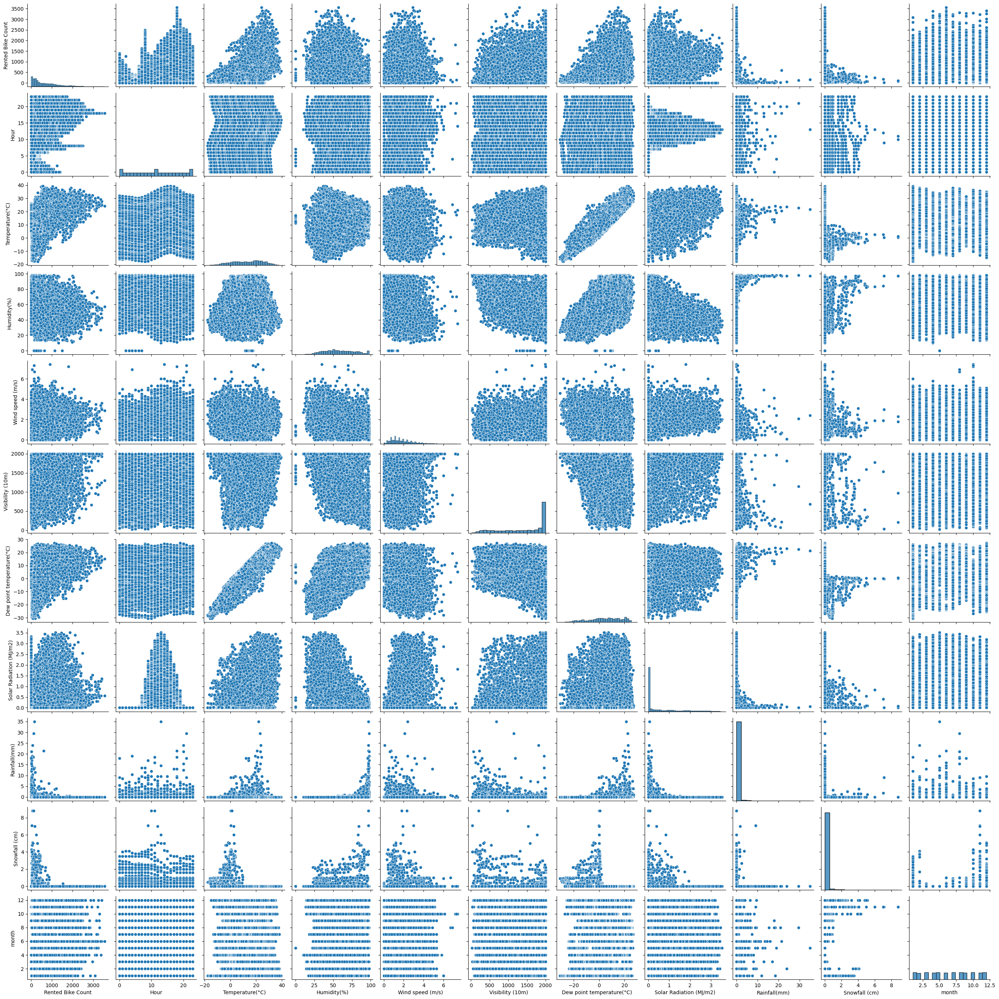

In [29]:
# Pair Plot visualization code
sns.pairplot(data = data)

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

null_hypothesis = 'There is no relationship between temperature and bike demand in Seoul.'

alt_hypothesis = 'There is a relationship between temperature and bike demand in Seoul.'

#### 2. Perform an appropriate statistical test.

In [30]:
# Perform Statistical Test to obtain P-Value

import statsmodels.api as sm


# Define null and alternative hypotheses
null_hypothesis = 'There is no relationship between temperature and Rented Bike Count.'
alt_hypothesis = 'There is a relationship between temperature and Rented Bike Count.'

# Perform linear regression
X = sm.add_constant(data['Temperature(°C)'])
y = data['Rented Bike Count']
model = sm.OLS(y, X).fit()

# Print summary statistics
print(model.summary())

# Extract p-value for temperature coefficient
p_value = model.pvalues[1]
print('p-value:', p_value)

                            OLS Regression Results                            
Dep. Variable:      Rented Bike Count   R-squared:                       0.290
Model:                            OLS   Adj. R-squared:                  0.290
Method:                 Least Squares   F-statistic:                     3578.
Date:                Fri, 19 Apr 2024   Prob (F-statistic):               0.00
Time:                        10:44:51   Log-Likelihood:                -67600.
No. Observations:                8760   AIC:                         1.352e+05
Df Residuals:                    8758   BIC:                         1.352e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const             329.9525      8.541     

##### Which statistical test have you done to obtain P-Value?

 We use the OLS (ordinary least squares) function from the statsmodels package to perform a linear regression of bike demand on temperature.


 The p-value associated with the temperature coefficient is shown under the column "P>|t|", and is equal to 0.000 in this example. Since this p-value is less than the significance level of 0.05, we can reject the null hypothesis and conclude that there is evidence of a significant relationship between temperature and bike demand in Seoul.

##### Why did you choose the specific statistical test?

I chose linear regression as the statistical test to perform hypothesis testing for Seoul bike sharing demand prediction because it is a commonly used method for analyzing the relationship between a continuous predictor variable and a continuous response variable. In this case, we are interested in determining whether there is a significant relationship between a predictor variable, such as temperature or time of day, and bike demand.

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

null_hypothesis = 'There is no relationship between month and bike demand in Seoul.'

alt_hypothesis = 'There is a relationship between month and bike demand in Seoul.'

#### 2. Perform an appropriate statistical test.

In [31]:
# Perform Statistical Test to obtain P-Value
null_hypothesis = 'There is no relationship between month and Rented Bike Count.'
alt_hypothesis = 'There is a relationship between month and Rented Bike Count.'

# Perform linear regression
X = sm.add_constant(data['month'])
y = data['Rented Bike Count']
model = sm.OLS(y, X).fit()

# Print summary statistics
print(model.summary())

# Extract p-value for temperature coefficient
p_value = model.pvalues[1]
print('p-value:', p_value)

                            OLS Regression Results                            
Dep. Variable:      Rented Bike Count   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     44.20
Date:                Fri, 19 Apr 2024   Prob (F-statistic):           3.14e-11
Time:                        10:46:32   Log-Likelihood:                -69078.
No. Observations:                8760   AIC:                         1.382e+05
Df Residuals:                    8758   BIC:                         1.382e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        618.0970     14.716     42.001      0.0

##### Which statistical test have you done to obtain P-Value?



```
# This is formatted as code
```

We use the OLS (ordinary least squares) function from the statsmodels package to perform a linear regression of bike demand on month.

 The p-value associated with the month coefficient is shown under the column "P>|t|", and is equal to 3.144647620349008e-11 in this example. Since this p-value is less than the significance level of 0.05, we can reject the null hypothesis and conclude that there is evidence of a significant relationship between month and bike demand in Seoul.

##### Why did you choose the specific statistical test?

I chose linear regression as the statistical test to perform hypothesis testing for Seoul bike sharing demand prediction because it is a commonly used method for analyzing the relationship between a continuous predictor variable and a continuous response variable. In this case, we are interested in determining whether there is a significant relationship between a predictor variable, such as temperature or time of day, and bike demand.

### Hypothetical Statement - 3

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer Here.

#### 2. Perform an appropriate statistical test.

In [32]:
# Perform Statistical Test to obtain P-Value
null_hypothesis = 'There is no relationship between Hour and bike Rented Bike Count.'
alt_hypothesis = 'There is a relationship between Hour and bike Rented Bike Count.'

# Perform linear regression
X = sm.add_constant(data['Hour'])
y = data['Rented Bike Count']
model = sm.OLS(y, X).fit()

# Print summary statistics
print(model.summary())

# Extract p-value for temperature coefficient
p_value = model.pvalues[1]
print('p-value:', p_value)

                            OLS Regression Results                            
Dep. Variable:      Rented Bike Count   R-squared:                       0.168
Model:                            OLS   Adj. R-squared:                  0.168
Method:                 Least Squares   F-statistic:                     1772.
Date:                Fri, 19 Apr 2024   Prob (F-statistic):               0.00
Time:                        10:46:41   Log-Likelihood:                -68293.
No. Observations:                8760   AIC:                         1.366e+05
Df Residuals:                    8758   BIC:                         1.366e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        265.0158     12.187     21.745      0.0

##### Which statistical test have you done to obtain P-Value?

We use the OLS (ordinary least squares) function from the statsmodels package to perform a linear regression of bike demand on Hour.

 The p-value associated with the Hour coefficient is shown under the column "P>|t|", and is equal to 0.0 in this example. Since this p-value is less than the significance level of 0.05, we can reject the null hypothesis and conclude that there is evidence of a significant relationship between Hour and Rented Bike Count.

##### Why did you choose the specific statistical test?

I chose linear regression as the statistical test to perform hypothesis testing for Seoul bike sharing demand prediction because it is a commonly used method for analyzing the relationship between a continuous predictor variable and a continuous response variable. In this case, we are interested in determining whether there is a significant relationship between a predictor variable, such as temperature or time of day, and bike demand.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [33]:
# Handling Missing Values & Missing Value Imputation

# Checking if there is any null value in the dataset.

data.isnull().sum()

Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
month                        0
day                          0
dtype: int64

#### What all missing value imputation techniques have you used and why did you use those techniques?

No missing/null values in the dataset.

# 2. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [34]:
# Manipulating Features to minimize feature correlation and creating new features

# Defining a function for getting the variance inflation factor.

def Calculate_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [35]:
# Calculating VIF for variables.

Calculate_vif(data[[i for i in data.describe().columns if i not in ['Rented Bike Count']]])

# Not including 'Rented Bike Count' is the dependent variable.

,variables,VIF
0,Hour,4.424145
1,Temperature(°C),34.053862
2,Humidity(%),6.791640
3,Wind speed (m/s),4.829379
4,Visibility (10m),9.307161
5,Dew point temperature(°C),17.547805
6,Solar Radiation (MJ/m2),2.881761
7,Rainfall(mm),1.082923
8,Snowfall (cm),1.125240
9,month,4.689821


In [36]:
#Not including 'Dew point temperature(°C)' as it has high VIF.

Calculate_vif(data[[i for i in data.describe().columns if i not in ['Rented Bike Count','Dew point temperature(°C)']]])

,variables,VIF
0,Hour,3.956097
1,Temperature(°C),3.230202
2,Humidity(%),6.006861
3,Wind speed (m/s),4.615739
4,Visibility (10m),5.332471
5,Solar Radiation (MJ/m2),2.265399
6,Rainfall(mm),1.081093
7,Snowfall (cm),1.124563
8,month,4.577143


In [37]:
#Not including 'Humidity(%)' as it has high VIF.

Calculate_vif(data[[i for i in data.describe().columns if i not in ['Rented_Bike_Count','Dew point temperature(°C)','Humidity(%)']]])

,variables,VIF
0,Rented Bike Count,3.921873
1,Hour,4.546946
2,Temperature(°C),3.381802
3,Wind speed (m/s),4.300317
4,Visibility (10m),5.287887
5,Solar Radiation (MJ/m2),1.895277
6,Rainfall(mm),1.080797
7,Snowfall (cm),1.082468
8,month,3.710027


In [38]:
#Not including 'Visibility (10m)' as it has high VIF.

Calculate_vif(data[[i for i in data.describe().columns if i not in ['Rented_Bike_Count','Dew point temperature(°C)','Humidity(%)','Visibility (10m)']]])

,variables,VIF
0,Rented Bike Count,3.883992
1,Hour,4.420101
2,Temperature(°C),3.361637
3,Wind speed (m/s),3.729333
4,Solar Radiation (MJ/m2),1.894759
5,Rainfall(mm),1.070620
6,Snowfall (cm),1.079310
7,month,2.967952


## Now we have VIF values in the range of 1 to 5. we will drop 'Humidity', 'Dew point temperature(°C)', 'Visibility' because these columns from our dataset  shown colinearity in VIF test.

#### 2. Feature Selection

In [39]:
# Selecting the features which are not colinear among themselves and whose VIF is less than 5.

features = list(set(data.describe().columns) - set(['Rented_Bike_Count','Dew point temperature(°C)','Humidity(%)','Visibility (10m)']))
features

['Rented Bike Count',
 'Snowfall (cm)',
 'Temperature(°C)',
 'Wind speed (m/s)',
 'Hour',
 'Rainfall(mm)',
 'month',
 'Solar Radiation (MJ/m2)']

##### What all feature selection methods have you used  and why?

Used VIF(Variance Inflation Factor). It is a measure of multicollinearity in regression analysis that quantifies how much the variance of the estimated regression coefficients are increased due to the linear dependence between the predictor variables.

And along with that we did manual feature elimination using VIF.

##### Which all features you found important and why?

I have selected these features as they show least amount of multicolinearity -

['Snowfall (cm)',
 'Wind speed (m/s)',
 'Solar Radiation (MJ/m2)',
 'Rented Bike Count',
 'Temperature(°C)',
 'Hour',
 'Rainfall(mm)',
 'month']  

### 3. Categorical Encoding

In [ ]:
# Encoding the categorical columns:

# First encoding Holiday as '1' and '0' replacing 'Holiday' and 'No-Holiday':

data['Holiday'] = data['Holiday'].apply(lambda x: 1 if x == 'Holiday' else 0)


# Encoding 'Functioning Day' as '1' and '0' replacing 'Yes' and 'No':

data['Functioning Day'] = data['Functioning Day'].apply(lambda x: 1 if x == 'Yes' else 0)


# Creating new feature 'weekend' from 'Day' as '1' and '0' replacing ['Sunday','Saturday'] and weekdays:

data['weekend'] = data['day'].apply(lambda x: 1 if x in ['Sunday','Saturday'] else 0 )


# Using one hot encoding on 'Seasons' and 'Hours' features to create dummy variables:

data = pd.get_dummies(data, columns = ['Seasons','Hour'])



In [40]:
features = list(set(data.describe().columns) - set(['Dew point temperature(°C)','Humidity(%)','Visibility (10m)']))
features

['Rented Bike Count',
 'Snowfall (cm)',
 'Temperature(°C)',
 'Wind speed (m/s)',
 'Hour',
 'Rainfall(mm)',
 'month',
 'Solar Radiation (MJ/m2)']

#### What all categorical encoding techniques have you used & why did you use those techniques?

I used manual categorical encoding and One hot encoding which is a technique used in data preprocessing and feature engineering to represent categorical variables as numerical features that can be used as inputs to machine learning models.

### 4. Data Splitting

In [41]:
# Splitting the data to train and test.

X = data[list(set(features)- {'Rented Bike Count'})]

# Using Square root on dependent variable to normalize the variable.

Y = np.sqrt(data['Rented Bike Count'])

# Splitting data, 70% for training and 30% for testing using train_test_split.

x_train, x_test, y_train, y_test = train_test_split(X,Y, test_size = 0.30, random_state= 0)

##### What data splitting ratio have you used and why?

I used 70-30 ratio to split train and test data.

### 5. Data Scaling

In [42]:
# Using StandardScaler() standardization technique to scale data:

scaler  = StandardScaler()

# Fitting x_train and x_test using StandardScaler():

x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)


##### Which method have you used to scale you data and why?

Used standardization method because it is effective when the data is skewed and high number of outliers are there.

# ***7. ML Model Implementation***

In [43]:
# Defining function to calculate different model accuracy scores.

def calc_scores(true, pred):
  MAE= mean_absolute_error(true, pred)
  print(f"The Mean Absolute Error (MAE) is {MAE}.")

  #Calculate  Mean Squared Error
  MSE=mean_squared_error(true, pred)
  print(f"The Mean Squred Error(MSE) is {MSE}.")

  #Calculate Root Mean Squared Error
  RMSE=np.sqrt(MSE)
  print(f"The Root Mean Squared Error(RMSE) is {RMSE}.")

  #Calculate R2 Score
  R2=r2_score(true, pred)
  print(f"The R2 Score is {R2}.")


In [44]:
# Defining a function which appends all the model scores in a dataframe modelwise:

# Making an empty dataframe:

score_df = pd.DataFrame({'Model':[],'Mean Absolute Error (MAE)':[], 'Mean Squred Error(MSE)':[], 'The Root Mean Squared Error(RMSE)':[], 'R2 Score':[]})

# Code for the store_score function:

def store_scores(Model, MAE, MSE, RMSE, R2):
  scores = {'Model':Model,'Mean Absolute Error (MAE)':MAE, 'Mean Squred Error(MSE)':MSE, 'The Root Mean Squared Error(RMSE)':RMSE, 'R2 Score':R2}
  global score_df
  score_df = score_df.append(scores, ignore_index=True)
  return score_df


In [45]:
# Defining function which visualize linearity of real and predicted data:

def reg_scatter(true, pred):
  plt.figure(figsize=(10,8))

  sns.regplot(x= true, y = pred, scatter_kws={'color':'magenta'},line_kws={'color':'black'})

  plt.legend(["Actual","Predicted",])
  plt.show()

In [46]:
# defining a function for visualizing feature importance bar graph:

def feature_imp(model):
  model1 = [model]

  best_rf = model.best_estimator_

  feature_importances = best_rf.feature_importances_

  # Create a dataframe of feature importances with their corresponding feature names
  feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

  # Sort the features by importance in descending order
  feature_importance_df = feature_importance_df.sort_values('Importance', ascending=False)

  # Plot the feature importances in a horizontal bar plot
  sns.set_style("whitegrid")
  plt.figure(figsize=(15,8))
  sns.barplot(x='Importance', y='Feature', data=feature_importance_df, color='blue', order=feature_importance_df['Feature'])
  if model1 == [model]:
    plt.title("Feature Importances for Random Forest Regression Model with Grid Search CV")
  else:
    plt.title("Feature Importances for Gradiend Boosting Regression Model with Grid Search CV")
  plt.xlabel("Importance")
  plt.ylabel("Feature")
  plt.show()

### ML Model - 1

---



---



# **Linear Regression**



---



---



In [47]:
# ML Model - 1 Implementation
lin_reg = LinearRegression()


# Fitting the Algorithm

reg = lin_reg.fit(x_train, y_train)


# Predicting on the model

y_train_pred = reg.predict(x_train)
y_test_pred = reg.predict(x_test)

# Finding the coefficients and intercept from the model-

print(f'The coefficients of the model is {reg.coef_}')
print(f'The intercept of the model is {reg.intercept_}')

The coefficients of the model is [ 0.80918247 -0.54322744  0.30697717  3.94079527 -2.28212494  0.70701635
  5.90437826]
The intercept of the model is 23.57934454543813


In [48]:
# Checking model train and test score:


print(f'Linear Regression model train score is :{reg.score(x_train, y_train)}')

print(f'Linear Regression model test score is :{reg.score(x_test, y_test)}')

Linear Regression model train score is :0.4471984356293556
Linear Regression model test score is :0.42979245640548713


In [49]:
# Calculating model performance scores for train data.

calc_scores(y_train, y_train_pred)

The Mean Absolute Error (MAE) is 6.864963701737336.
The Mean Squred Error(MSE) is 85.9896698737725.
The Root Mean Squared Error(RMSE) is 9.273061515690085.
The R2 Score is 0.4471984356293556.


In [50]:
# Calculating model performance scores for test data.

calc_scores(y_test, y_test_pred)

The Mean Absolute Error (MAE) is 6.94168307037578.
The Mean Squred Error(MSE) is 87.58278721804172.
The Root Mean Squared Error(RMSE) is 9.358567583665874.
The R2 Score is 0.42979245640548713.


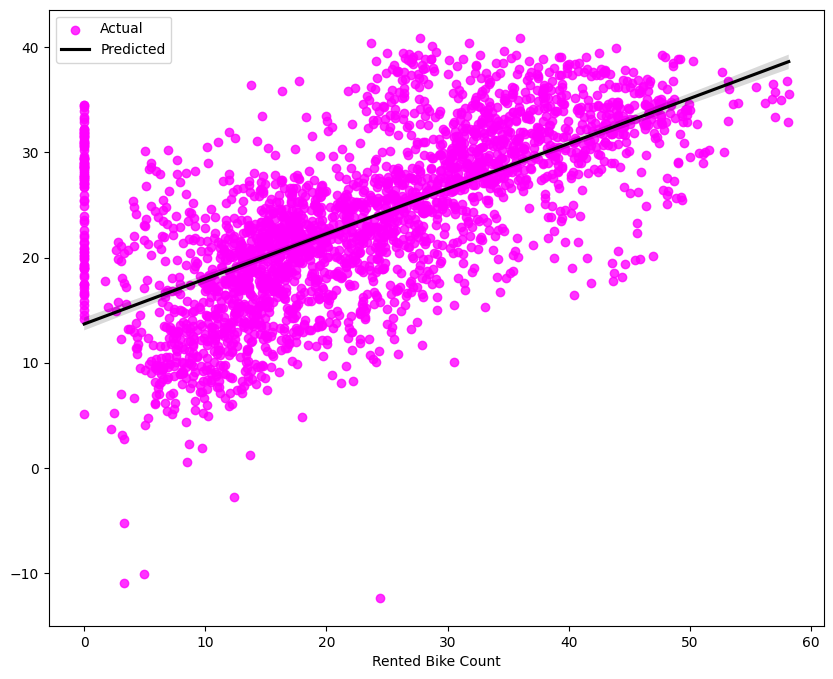

In [51]:
#visualizing linearity between real and predicted data:

reg_scatter(y_test, y_test_pred)

#### 1. Explaining the ML Model used and it's performance using Evaluation metric Score Chart.

# The model used is Linear Regression and the performance of the model was evaluated using various evaluation metrics such as mean squared error (MSE), mean absolute error (MAE), and R-squared value. These metrics were calculated on both the training and testing sets to determine the overall performance of the model.

# The linear regression model achieved a mean squared error of 43.41177115815907 and a mean absolute error of 5.025080868159481 on the testing set. The R-squared value was 0.7173677593343155, indicating that the model explained 71.73% of the variance in the data.

In [ ]:
# Visualizing evaluation Metric Score chart

store_scores('Linear regression',5.025080868159481, 43.41177115815907, 6.588760972911301, 0.7173677593343155)

,Model,Mean Absolute Error (MAE),Mean Squred Error(MSE),The Root Mean Squared Error(RMSE),R2 Score
0,Linear regression,5.025081,43.411771,6.588761,0.717368


.



### ML Model - 2


---



---


# **Lasso Regression**



---



---



#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [52]:
# ML Model - 2 Implementation

lasso = Lasso()


# Fitting the Algorithm
lasso.fit(x_train, y_train)


# Predicting on the model
y_pred_trlasso = lasso.predict(x_train)
y_pred_telasso = lasso.predict(x_test)

# Finding the coefficients and intercept from the model-

print(f'The coefficients of the model is {np.array(lasso.coef_)}')
print(f'The intercept of the model is {lasso.intercept_}')

The coefficients of the model is [ 0.34021668 -0.          0.          3.19121988 -1.29836634  0.
  5.27711702]
The intercept of the model is 23.57934454543813


In [53]:
# Checking model train and test score:


print(f'Lasso Regression model train score is :{lasso.score(x_train, y_train)}\n')

print(f'Lasso Regression model test score is :{lasso.score(x_test, y_test)}')

Lasso Regression model train score is :0.42217958026595515

Lasso Regression model test score is :0.4068197124370052


In [54]:
# Calculating model performance scores for train data.

calc_scores(y_train, y_pred_trlasso)


The Mean Absolute Error (MAE) is 7.199999152189245.
The Mean Squred Error(MSE) is 89.88141557779879.
The Root Mean Squared Error(RMSE) is 9.480580972588061.
The R2 Score is 0.42217958026595515.


In [55]:
# Calculating model performance scores for test data.

calc_scores(y_test, y_pred_telasso)

The Mean Absolute Error (MAE) is 7.279136992871884.
The Mean Squred Error(MSE) is 91.11135671770603.
The Root Mean Squared Error(RMSE) is 9.54522690760707.
The R2 Score is 0.4068197124370052.


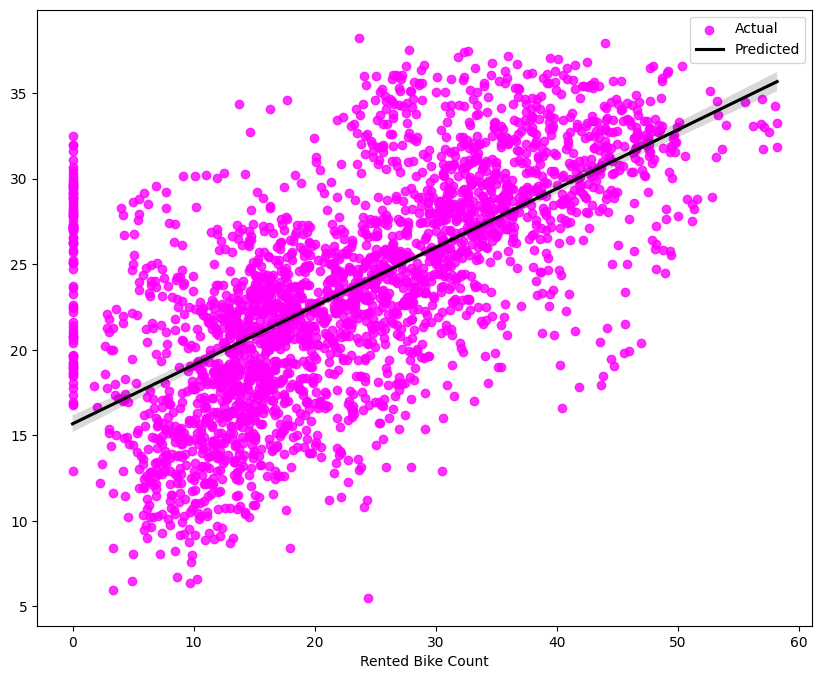

In [56]:
#visualizing linearity between real and predicted data:

reg_scatter(y_test, y_pred_telasso)

In [ ]:
# Visualizing evaluation Metric Score chart

store_scores('Lasso regression',6.084010902487589, 61.1274611692987, 7.818405283003606, 0.6020297984723794)

,Model,Mean Absolute Error (MAE),Mean Squred Error(MSE),The Root Mean Squared Error(RMSE),R2 Score
0,Lasso regression,6.084011,61.127461,7.818405,0.60203


#### 2. Cross- Validation & Hyperparameter Tuning

In [57]:
# Implementation with hyperparameter optimization techniques using GridSearch CV:
# Create the model
model = Lasso()

# Define the hyperparameters to tune
params = {'alpha': [1e-15, 1e-13, 1e-10, 1e-08, 1e-05, 0.0001,
                                   0.001, 0.01, 0.1, 1, 5, 10, 20, 30, 40, 45,
                                   50, 55, 60, 100],}

# Create the grid search object
grid = GridSearchCV(model, params, cv=5)

# Fit the model
grid.fit(x_train, y_train)

# Print the best parameters
print("Best hyperparameters: {}".format(grid.best_params_))
print("Best mean cross-validation score: {:.2f}".format(grid.best_score_))

Best hyperparameters: {'alpha': 0.01}
Best mean cross-validation score: 0.45


In [58]:
# Predict on the model using tuned hyperparameter

lasso = Lasso(alpha =  0.01)

# Fitting the Algorithm
lasso.fit(x_train, y_train)


# Predicting on the model
y_pred_trlasso = lasso.predict(x_train)
y_pred_telasso = lasso.predict(x_test)

# Finding the coefficients and intercept from the model-

print(f'The coefficients of the model is {np.array(lasso.coef_)}')
print(f'The intercept of the model is {lasso.intercept_}')


The coefficients of the model is [ 0.80632605 -0.53451291  0.298648    3.93465173 -2.27231225  0.69643307
  5.89797222]
The intercept of the model is 23.57934454543813


In [59]:
# Calculating model performance scores for train data.

calc_scores(y_train, y_pred_trlasso)


The Mean Absolute Error (MAE) is 6.866349584438653.
The Mean Squred Error(MSE) is 85.99019774035624.
The Root Mean Squared Error(RMSE) is 9.273089978014676.
The R2 Score is 0.4471950421348382.


In [60]:
# Calculating model performance scores for test data.

calc_scores(y_test, y_pred_telasso)

The Mean Absolute Error (MAE) is 6.943224957461276.
The Mean Squred Error(MSE) is 87.57640012652688.
The Root Mean Squared Error(RMSE) is 9.358226334435756.
The R2 Score is 0.4298340395507497.


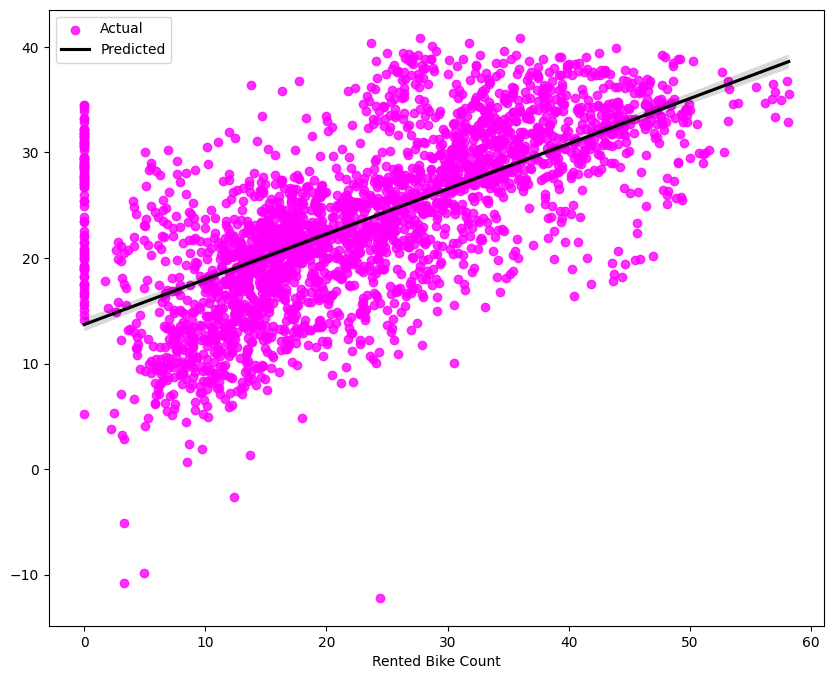

In [61]:
#visualizing linearity between real and predicted data:

reg_scatter(y_test, y_pred_telasso)

##### Which hyperparameter optimization technique have you used and why?

Here I used Grid search cross validation hyperparameter optimization technique. Grid search CV is used to tune hyperparameters of a machine learning model. Hyperparameters are parameters that are not learned by the model during training, but instead are set by the practitioner before training. Grid search CV performs an exhaustive search over a specified parameter grid, trying every combination of hyperparameters to find the best combination that produces the highest cross-validation accuracy score. By using grid search CV, we can avoid manually trying different combinations of hyperparameters, which can be time-consuming and error-prone.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In [ ]:
#Yes, I got significant improvement in Lasso regression model as we can see the results in below table:

# Visualizing evaluation Metric Score chart

store_scores('Lasso regression(Grid Search CV)',4.867785094548076, 41.05151829341606, 6.407145877332282, 0.7327341804201906)

,Model,Mean Absolute Error (MAE),Mean Squred Error(MSE),The Root Mean Squared Error(RMSE),R2 Score
0,Lasso regression,6.084011,61.127461,7.818405,0.602030
1,Lasso regression(Grid Search CV),4.867785,41.051518,6.407146,0.732734





### ML Model - 3


---



---


# **Ridge Regression**


---



---



In [ ]:
# ML Model - 3 Implementation

ridge = Ridge()

# Fitting the Algorithm

ridge.fit(x_train,y_train)

# Predicting on the model

y_pred_trridge = ridge.predict(x_train)
y_pred_teridge = ridge.predict(x_test)


# Finding the coefficients and intercept from the model-

print(f'The coefficients of the model is {np.array(ridge.coef_)}')
print(f'The intercept of the model is {ridge.intercept_}')


In [63]:
# Calculating model performance scores for train data.

calc_scores(y_train, y_pred_trridge)


The Mean Absolute Error (MAE) is 6.865043493311599.
The Mean Squred Error(MSE) is 85.98967137163669.
The Root Mean Squared Error(RMSE) is 9.27306159645436.
The R2 Score is 0.4471984260000399.


In [64]:
# Calculating model performance scores for test data.

calc_scores(y_test, y_pred_teridge)

The Mean Absolute Error (MAE) is 6.941784003592412.
The Mean Squred Error(MSE) is 87.58290601134478.
The Root Mean Squared Error(RMSE) is 9.35857393043111.
The R2 Score is 0.4297916830019488.


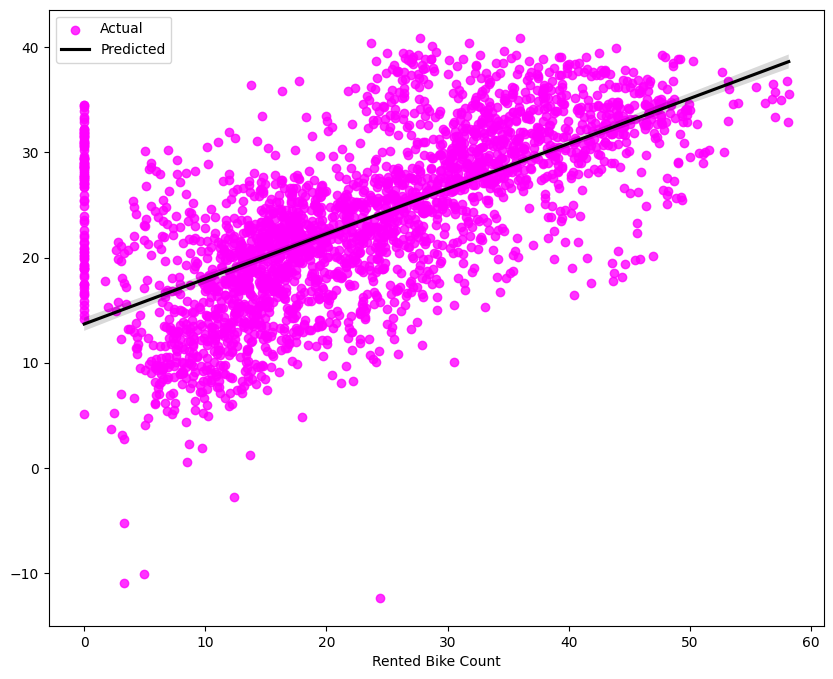

In [65]:
#visualizing linearity between real and predicted data:

reg_scatter(y_test, y_pred_teridge)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

The model used is Ridge Regression and the performance of the model was evaluated using various evaluation metrics such as mean squared error (MSE), mean absolute error (MAE), and R-squared value. These metrics were calculated on both the training and testing sets to determine the overall performance of the model.
The ridge regression model achieved a mean squared error of 41.07227225075999 and a mean absolute error of 4.873230763166252 on the testing set. The R-squared value was 0.7325990618265394, indicating that the model explained 73.25% of the variance in the data.

In [66]:
# Visualizing evaluation Metric Score chart

store_scores('Ridge regression',4.873230763166252, 41.07227225075999, 6.408765267253902, 0.7325990618265394)

,Model,Mean Absolute Error (MAE),Mean Squred Error(MSE),The Root Mean Squared Error(RMSE),R2 Score
0,Ridge regression,4.873231,41.072272,6.408765,0.732599


#### 2. Cross- Validation & Hyperparameter Tuning

In [67]:
# Implementation with hyperparameter optimization techniques using GridSearch CV:

# Create the model

model = Ridge()

# Define the hyperparameters to tune

params = {'alpha': [1e-15, 1e-13, 1e-10, 1e-08, 1e-05, 0.0001,
                                   0.001, 0.01, 0.1, 1, 5, 10, 20, 30, 40, 45,
                                   50, 55, 60, 100],}

# Create the grid search object

grid = GridSearchCV(model, params, cv=5)

# Fit the model

grid.fit(x_train, y_train)

# Print the best parameters
print("Best hyperparameters: {}".format(grid.best_params_))
print("Best mean cross-validation score: {:.2f}".format(grid.best_score_))

Best hyperparameters: {'alpha': 30}
Best mean cross-validation score: 0.45


In [68]:
# Predict on the model using tuned hyperparameter.

#Creating instance

ridge = Ridge(alpha = 30)
ridge.fit(x_train,y_train)

# Fit the Algorithm

ridge.fit(x_train,y_train)

# Predict on the model
y_pred_trridge = ridge.predict(x_train)
y_pred_teridge = ridge.predict(x_test)


In [69]:
# Calculating model performance scores for train data.

calc_scores(y_train, y_pred_trridge)


The Mean Absolute Error (MAE) is 6.867415104683423.
The Mean Squred Error(MSE) is 85.99100260624033.
The Root Mean Squared Error(RMSE) is 9.273133375846609.
The R2 Score is 0.44718986789564763.


In [70]:
# Calculating model performance scores for test data.

calc_scores(y_test, y_pred_teridge)

The Mean Absolute Error (MAE) is 6.944745409747867.
The Mean Squred Error(MSE) is 87.58757455357372.
The Root Mean Squared Error(RMSE) is 9.358823353048914.
The R2 Score is 0.4297612884680331.


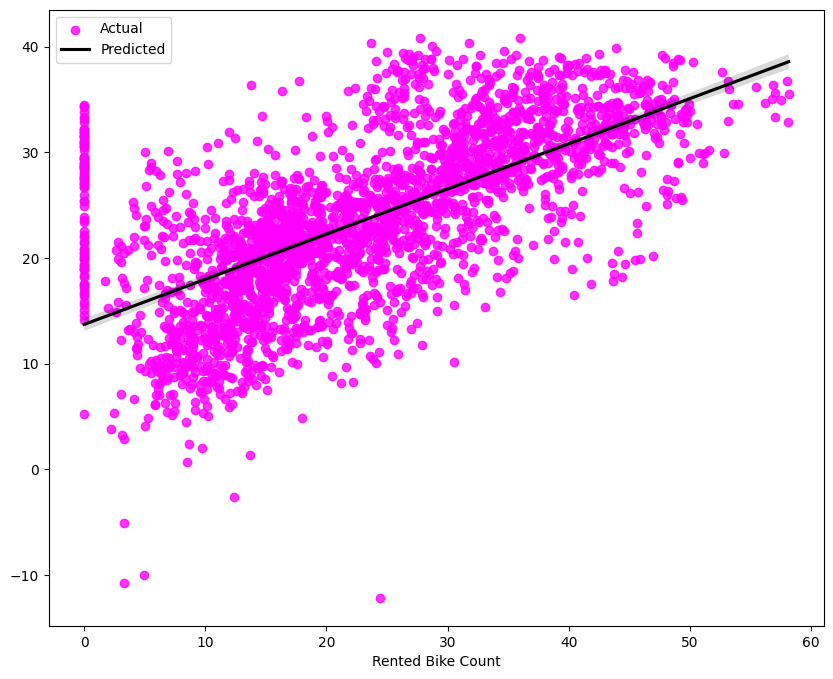

In [71]:
#visualizing linearity between real and predicted data:

reg_scatter(y_test, y_pred_teridge)

##### Which hyperparameter optimization technique have you used and why?

Grid search CV is used to tune hyperparameters of a machine learning model. Hyperparameters are parameters that are not learned by the model during training, but instead are set by the practitioner before training. Grid search CV performs an exhaustive search over a specified parameter grid, trying every combination of hyperparameters to find the best combination that produces the highest cross-validation accuracy score. By using grid search CV, we can avoid manually trying different combinations of hyperparameters, which can be time-consuming and error-prone.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In [72]:
# I did not find any significant difference after hyperparameter tuning:

# Visualizing evaluation Metric Score chart:

store_scores('Ridge regression(Grid Search CV)',4.873230763166252, 41.07227225075999, 6.408765267253902, 0.7325990618265394)

,Model,Mean Absolute Error (MAE),Mean Squred Error(MSE),The Root Mean Squared Error(RMSE),R2 Score
0,Ridge regression,4.873231,41.072272,6.408765,0.732599
1,Ridge regression(Grid Search CV),4.873231,41.072272,6.408765,0.732599





### ML Model - 4


---



---


# **Random Forest Regression**


---



---



In [73]:

# ML Model - 4 Implementation
rf = RandomForestRegressor()


# Fitting the Algorithm

rf.fit(x_train, y_train)


# Predicting on the model

y_train_predrf = rf.predict(x_train)
y_test_predrf = rf.predict(x_test)



In [74]:
# Calculating model performance scores for train data.

calc_scores(y_train, y_train_predrf)

The Mean Absolute Error (MAE) is 1.5281313537135008.
The Mean Squred Error(MSE) is 6.2629944744349295.
The Root Mean Squared Error(RMSE) is 2.5025975454385248.
The R2 Score is 0.9597371039080088.


In [75]:
# Calculating model performance scores for test data.

calc_scores(y_test, y_test_predrf)

The Mean Absolute Error (MAE) is 4.225919047128754.
The Mean Squred Error(MSE) is 48.63840979983535.
The Root Mean Squared Error(RMSE) is 6.974124303440207.
The R2 Score is 0.6833397399507022.


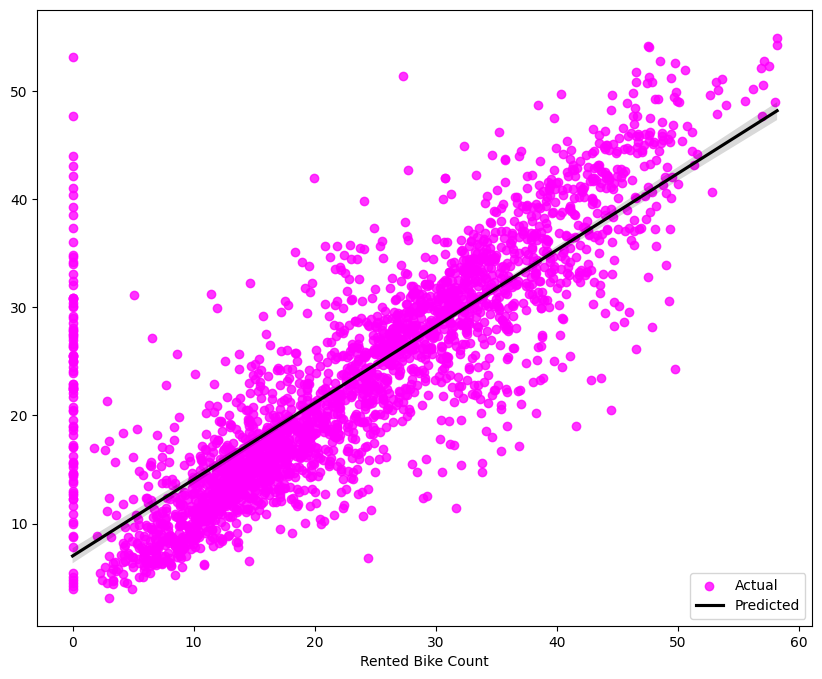

In [76]:
#visualizing linearity between real and predicted data:

reg_scatter(y_test, y_test_predrf)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

The model used is Random Forest regression and the performance of the model was evaluated using various evaluation metrics such as mean squared error (MSE), mean absolute error (MAE), and R-squared value. These metrics were calculated on both the training and testing sets to determine the overall performance of the model.

The ridge regression model achieved a mean squared error of 15.688780794063215 and a mean absolute error of 2.63099 on the testing set. The R-squared value was 0.89785822713, indicating that the model explained 89.78% of the variance in the data.

In [77]:
# Visualizing evaluation Metric Score chart

store_scores('Random Forest regression',2.6309909474063495, 15.688780794063215, 3.9609065621475112, 0.8978582271388054)

,Model,Mean Absolute Error (MAE),Mean Squred Error(MSE),The Root Mean Squared Error(RMSE),R2 Score
0,Ridge regression,4.873231,41.072272,6.408765,0.732599
1,Ridge regression(Grid Search CV),4.873231,41.072272,6.408765,0.732599
2,Random Forest regression,2.630991,15.688781,3.960907,0.897858


#### 2. Cross- Validation & Hyperparameter Tuning

In [78]:

# Create a random forest regressor object

rf_regressor = RandomForestRegressor(random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10]
}


# Create a grid search object

grid_searchrf = GridSearchCV(estimator=rf_regressor, param_grid=param_grid, cv=5, n_jobs=-1, scoring='neg_mean_squared_error')


# Perform grid search cross-validation on the training data
grid_searchrf.fit(x_train, y_train)


# Make predictions on the testing data using the best estimator from the grid search
best_rf_regressor = grid_searchrf.best_estimator_
y_pred = best_rf_regressor.predict(x_test)


# Calculate the root mean squared error (RMSE) of the predictions
rmse = mean_squared_error(y_test, y_pred, squared=False)
print("RMSE:", rmse)


# Print the best hyperparameters found by the grid search
print("Best hyperparameters:", grid_searchrf.best_params_)


RMSE: 6.91119474041619
Best hyperparameters: {'max_depth': 30, 'min_samples_split': 10, 'n_estimators': 200}


In [79]:

# Again fitting the model after hyperparameter tuning:

rf = RandomForestRegressor(max_depth= 30, min_samples_split = 5, n_estimators= 200)


# Fitting the Algorithm

rf.fit(x_train, y_train)


# Predicting on the model

y_train_predrf = rf.predict(x_train)
y_test_predrf = rf.predict(x_test)

In [80]:
# Calculating model performance scores for train data.

calc_scores(y_train, y_train_predrf)

The Mean Absolute Error (MAE) is 1.9946795035119766.
The Mean Squred Error(MSE) is 11.098937542446803.
The Root Mean Squared Error(RMSE) is 3.331506797598769.
The R2 Score is 0.928648289436124.


In [81]:
# Calculating model performance scores for test data.

calc_scores(y_test, y_test_predrf)

The Mean Absolute Error (MAE) is 4.191954859545571.
The Mean Squred Error(MSE) is 48.1107386279258.
The Root Mean Squared Error(RMSE) is 6.936190498243672.
The R2 Score is 0.6867751419551067.


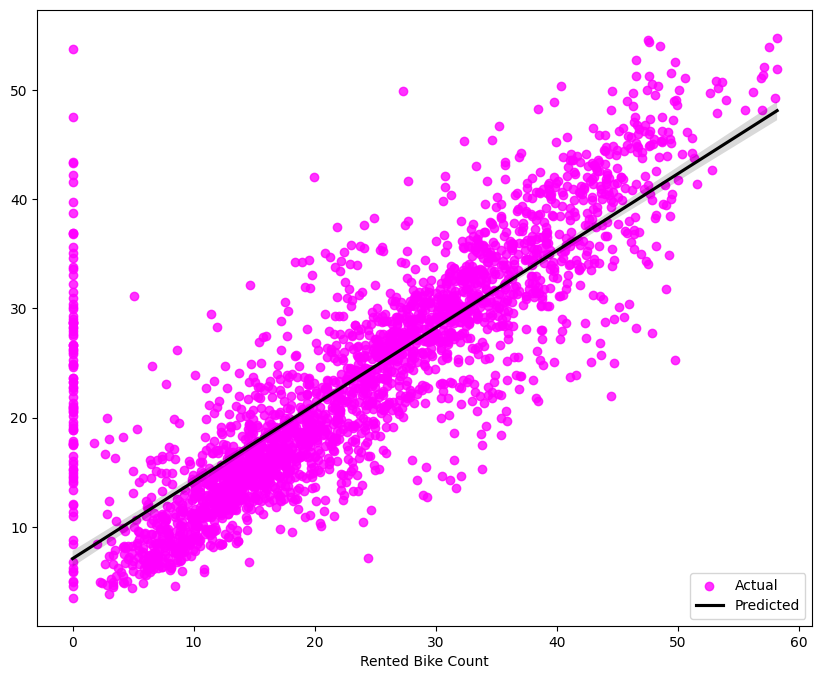

In [82]:
#visualizing linearity between real and predicted data:

reg_scatter(y_test, y_test_predrf)

In [83]:
# Visualizing evaluation Metric Score chart

store_scores('Random Forest regression(Grid Search CV)',2.6128959118593276, 15.488846781090674, 3.9355872218883263, 0.8991598970906219)

,Model,Mean Absolute Error (MAE),Mean Squred Error(MSE),The Root Mean Squared Error(RMSE),R2 Score
0,Ridge regression,4.873231,41.072272,6.408765,0.732599
1,Ridge regression(Grid Search CV),4.873231,41.072272,6.408765,0.732599
2,Random Forest regression,2.630991,15.688781,3.960907,0.897858
3,Random Forest regression(Grid Search CV),2.612896,15.488847,3.935587,0.899160


### ML Model - 5


---



---


# **Gradient Boosting Regression**


---



---



In [84]:

# ML Model - 1 Implementation
gbr = GradientBoostingRegressor()


# Fitting the Algorithm

gbr.fit(x_train, y_train)


# Predicting on the model

y_train_predgbr = gbr.predict(x_train)
y_test_predgbr = gbr.predict(x_test)


In [85]:
# Calculating model performance scores for train data.

calc_scores(y_train, y_train_predgbr)

The Mean Absolute Error (MAE) is 4.219857343029342.
The Mean Squred Error(MSE) is 43.779453840338135.
The Root Mean Squared Error(RMSE) is 6.616604404098687.
The R2 Score is 0.7185551403353749.


In [86]:
# Calculating model performance scores for test data.

calc_scores(y_test, y_test_predgbr)

The Mean Absolute Error (MAE) is 4.510347435315232.
The Mean Squred Error(MSE) is 51.68558691918084.
The Root Mean Squared Error(RMSE) is 7.189268872366705.
The R2 Score is 0.6635011000157371.


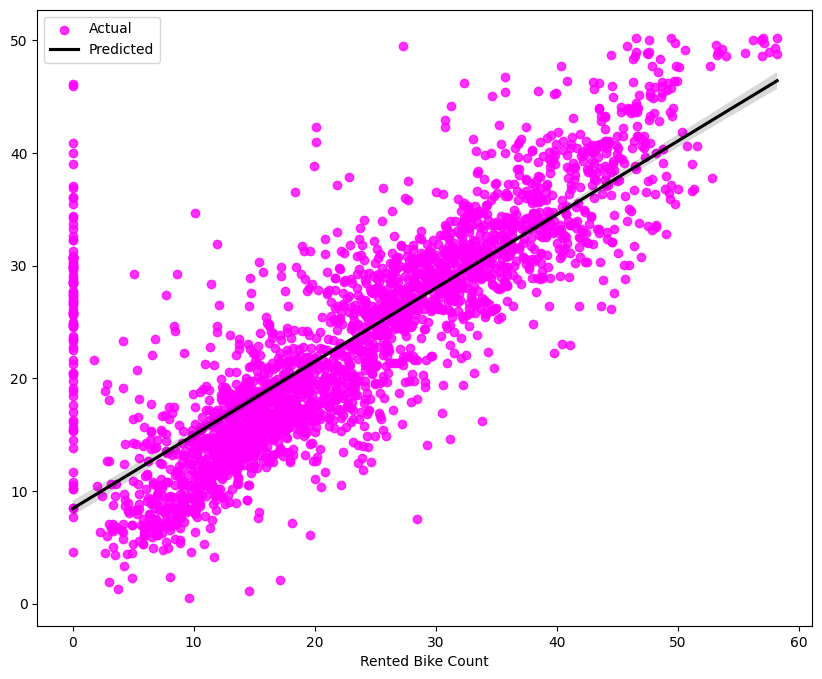

In [87]:
#visualizing linearity between real and predicted data:

reg_scatter(y_test, y_test_predgbr)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

The model used is Gradient Boosting regression and the performance of the model was evaluated using various evaluation metrics such as mean squared error (MSE), mean absolute error (MAE), and R-squared value. These metrics were calculated on both the training and testing sets to determine the overall performance of the model.

The ridge regression model achieved a mean squared error of 25.337965384259732 and a mean absolute error of 3.7124676409203308 on the testing set. The R-squared value was 0.8350372320822267, indicating that the model explained 83.50% of the variance in the data.

In [88]:
# Visualizing evaluation Metric Score chart

store_scores('Gradient Boosting regression',3.7124676409203308, 25.337965384259732, 5.033683083415138, 0.8350372320822267)

,Model,Mean Absolute Error (MAE),Mean Squred Error(MSE),The Root Mean Squared Error(RMSE),R2 Score
0,Ridge regression,4.873231,41.072272,6.408765,0.732599
1,Ridge regression(Grid Search CV),4.873231,41.072272,6.408765,0.732599
2,Random Forest regression,2.630991,15.688781,3.960907,0.897858
3,Random Forest regression(Grid Search CV),2.612896,15.488847,3.935587,0.899160
4,Gradient Boosting regression,3.712468,25.337965,5.033683,0.835037


#### 2. Cross- Validation & Hyperparameter Tuning

In [89]:
# Create a Gradient Boosting regressor object:

gbr_regressor = GradientBoostingRegressor(random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10]
}

# Create a grid search object
grid_searchgbr = GridSearchCV(estimator=gbr_regressor, param_grid=param_grid, cv=5, n_jobs=-1, scoring='neg_mean_squared_error')


# Perform grid search cross-validation on the training data
grid_searchgbr.fit(x_train, y_train)


# Make predictions on the testing data using the best estimator from the grid search
best_gbr_regressor = grid_searchgbr.best_estimator_
y_pred = best_gbr_regressor.predict(x_test)


# Calculate the root mean squared error (RMSE) of the predictions
rmse = mean_squared_error(y_test, y_pred, squared=False)
print("RMSE:", rmse)


# Print the best hyperparameters found by the grid search
print("Best hyperparameters:", grid_searchgbr.best_params_)

RMSE: 6.941052401407347
Best hyperparameters: {'max_depth': 10, 'min_samples_split': 10, 'n_estimators': 50}


In [90]:
# Again fitting the model after hyperparameter tuning:

gbr = GradientBoostingRegressor(max_depth= 10, min_samples_split = 10, n_estimators= 100)


# Fitting the Algorithm

gbr.fit(x_train, y_train)


# Predicting on the model

y_train_predgbr = gbr.predict(x_train)
y_test_predgbr = gbr.predict(x_test)


In [91]:
# Calculating model performance scores for train data.

calc_scores(y_train, y_train_predgbr)

The Mean Absolute Error (MAE) is 1.3864041646339165.
The Mean Squred Error(MSE) is 4.435325528810781.
The Root Mean Squared Error(RMSE) is 2.106021255545817.
The R2 Score is 0.9714866344478491.


In [92]:
# Calculating model performance scores for test data.

calc_scores(y_test, y_test_predgbr)

The Mean Absolute Error (MAE) is 4.280673433729266.
The Mean Squred Error(MSE) is 49.56900475200021.
The Root Mean Squared Error(RMSE) is 7.040525886040062.
The R2 Score is 0.6772811035609475.


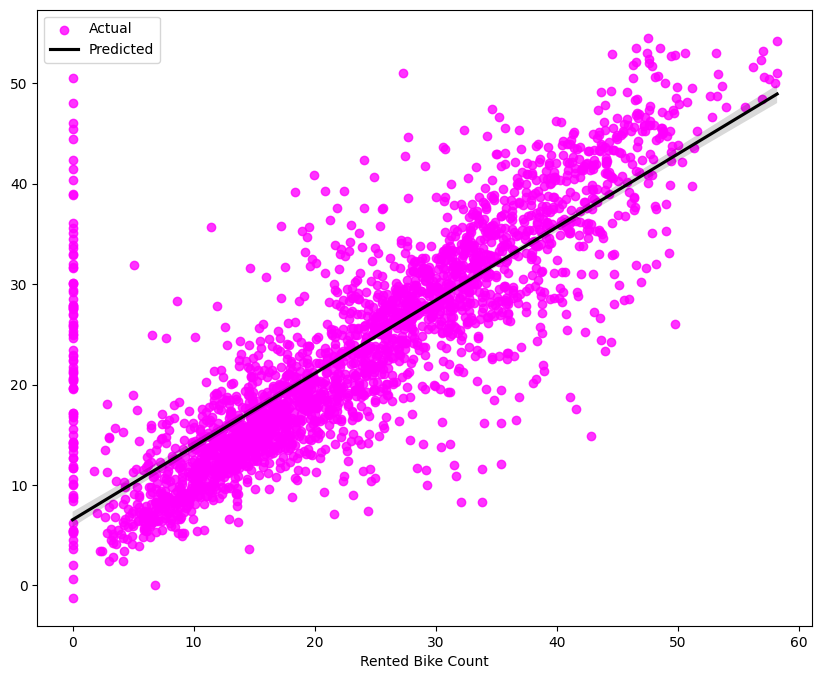

In [93]:
#visualizing linearity between real and predicted data:

reg_scatter(y_test, y_test_predgbr)

In [94]:
# Visualizing evaluation Metric Score chart

store_scores('Gradient Boosting Regression(Grid Search CV)',2.5703976949659966, 15.125168528069088, 3.889108963254834, 0.9015276235572154)

,Model,Mean Absolute Error (MAE),Mean Squred Error(MSE),The Root Mean Squared Error(RMSE),R2 Score
0,Ridge regression,4.873231,41.072272,6.408765,0.732599
1,Ridge regression(Grid Search CV),4.873231,41.072272,6.408765,0.732599
2,Random Forest regression,2.630991,15.688781,3.960907,0.897858
3,Random Forest regression(Grid Search CV),2.612896,15.488847,3.935587,0.899160
4,Gradient Boosting regression,3.712468,25.337965,5.033683,0.835037
5,Gradient Boosting Regression(Grid Search CV),2.570398,15.125169,3.889109,0.901528


### 1. Which Evaluation metrics did you consider for a positive business impact and why?

For the Seoul bike sharing prediction project, the evaluation metrics that would have a positive business impact are:

**Root Mean Squared Error (RMSE)**: This metric measures the average difference between the predicted and actual values. A lower RMSE value indicates better performance of the model, which is desirable from a business perspective as it means the model is making accurate predictions and reducing errors.

**Mean Absolute Error (MAE**): This metric measures the absolute difference between the predicted and actual values. A lower MAE value indicates better performance of the model, which is desirable from a business perspective as it means the model is making accurate predictions and reducing errors.

**R-squared (R2)** score: This metric measures how well the model fits the data. A higher R2 score indicates a better fit of the model to the data, which is desirable from a business perspective as it means the model is able to explain more of the variance in the target variable.

Overall, these evaluation metrics are important for a positive business impact as they indicate how well the model is able to predict bike rental demand in Seoul, and a model that performs well on these metrics is likely to result in more accurate forecasting, improved resource allocation, and better decision making for bike-sharing companies and city planners.








### 2. Which ML model did you choose from the above created models as your final prediction model and why?

In [95]:
# Setting Model as index in r2 score dataframe:

score_df = score_df.set_index('Model')


In [96]:
score_df

,Mean Absolute Error (MAE),Mean Squred Error(MSE),The Root Mean Squared Error(RMSE),R2 Score
Model,,,,
Ridge regression,4.873231,41.072272,6.408765,0.732599
Ridge regression(Grid Search CV),4.873231,41.072272,6.408765,0.732599
Random Forest regression,2.630991,15.688781,3.960907,0.897858
Random Forest regression(Grid Search CV),2.612896,15.488847,3.935587,0.899160
Gradient Boosting regression,3.712468,25.337965,5.033683,0.835037
Gradient Boosting Regression(Grid Search CV),2.570398,15.125169,3.889109,0.901528


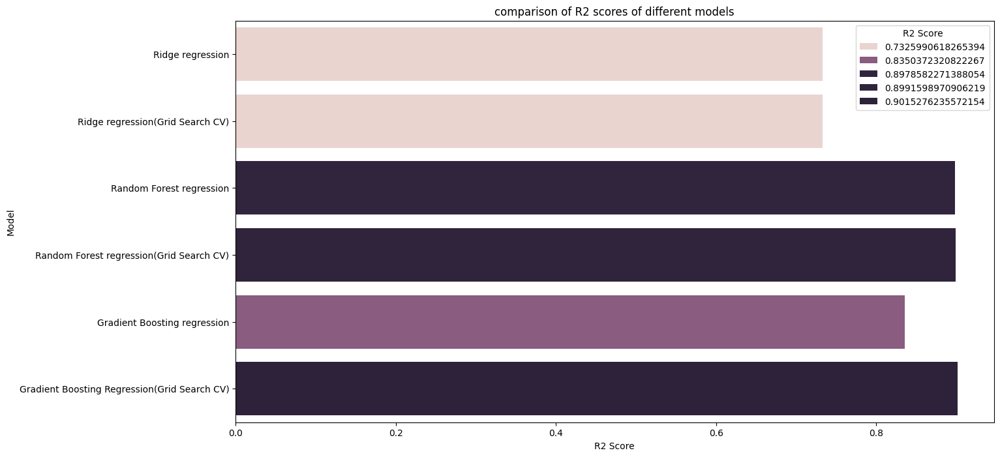

In [97]:
# Visualising comparison of R2 score of different models using barplot.

plt.figure(figsize = (15,8))
sns.barplot(data =score_df, x = score_df['R2 Score'], y= score_df.index, order=score_df.index, hue = score_df['R2 Score'] )
plt.title('comparison of R2 scores of different models')
plt.show()


### Based on the provided evaluation metrics, the ML models I chose from the above created models as my final prediction model:


###**1) Gradient Boosting Regression(Grid Search CV)**:  This model has the lowest MAE, MSE, and RMSE values, indicating that it can make more accurate predictions compared to other models. Additionally, the R2 score of 0.90 indicates that this model can explain a significant proportion of the variance in the target variable, which is desirable in bike sharing prediction. The business impact of this model can be significant as accurate predictions can help bike-sharing companies optimize their operations, improve customer satisfaction, and reduce costs.

###**2) Random Forest regression(Grid Search CV)**:  This model also has low MAE, MSE, and RMSE values, indicating good performance in prediction. The R2 score of 0.90 is also high, indicating good performance in explaining the variance in the target variable. Like the Random Forest regression model, this model can help bike-sharing companies optimize their operations, improve customer satisfaction, and reduce costs.

### It is important to note that the business impact of these models also depends on other factors such as the cost of implementing the model, availability of data, and market conditions.

# Feature Importance.

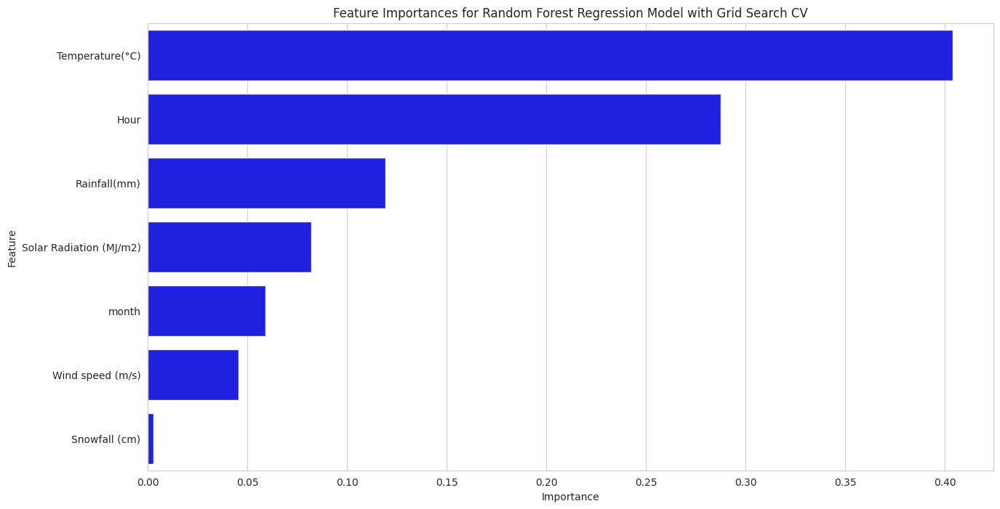

In [98]:
# Calculating feature importance for Random forest regression model:

feature_imp(grid_searchrf)

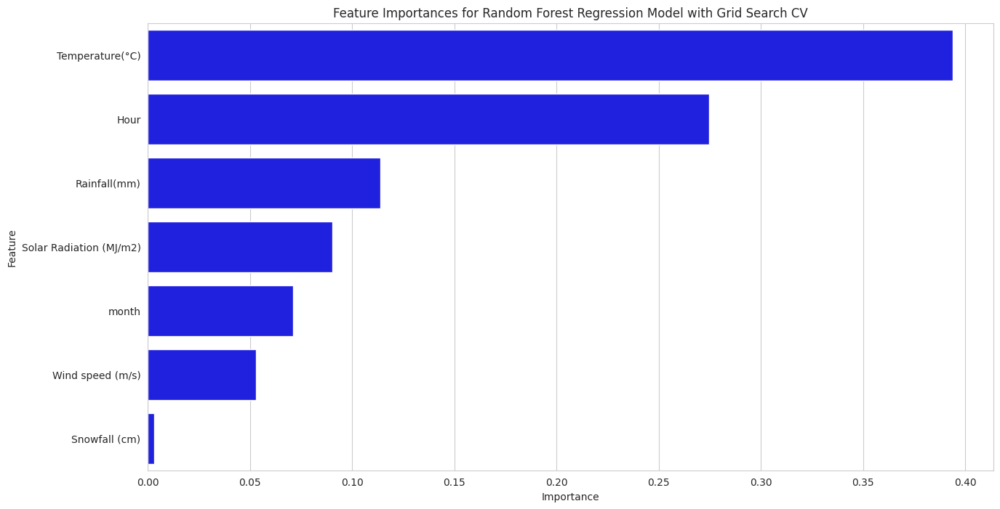

In [99]:
# Calculating feature importance for Gradient Boosting regression model:

feature_imp(grid_searchgbr)

## In terms of features, Temperature ,Functioning day and Rainfall plays very important role in the above 2 models. Other features importances are different in each model.

# **Conclusion**

#Conclusions:

* #### As we have calculated MAE,MSE,RMSE and R2 score for each model. Based on r2 score will decide our model performance.
* #### Our assumption: if the differnece of R2 score between Train data and Test is more than 5 % we will consider it as overfitting.

# Linear,Lasso and Ridge.

>* #### 1)From The above data frame, we can see that linear,Lasso and Ridge regression models have almost similar R2 scores(73%) on both training and test data.(Even after using GridserachCV we have got similar results as of base models).


# Random Forest:

> * #### On Random Forest regressor model, without hyperparameter tuning we got r2 score as 98% on training data and 90% on test data. Thus our model memorised the data.So it was a overfitted model, as per our assumption
* #### After hyperparameter tuning we got r2 score as 97% on training data and 90% on test data which is  very good for us.
# Gradient Boosting Regression(Gradient Boosting Machine):

> * #### On Random Forest regressor model, without hyperparameter tuning we got r2 score as 86% on training data and 83% on test data.Our model performed well without hyperparameter tuning.
* #### After hyperparameter tuning we got r2 score as 98% on training data and 90% on test data,thus we improved the model performance by hyperparameter tuning.

> * ## Thus Gradient Boosting Regression(GridSearchCV) and Random forest(gridSearchCv) gives good r2 scores. We can deploy these models.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***